<a href="https://colab.research.google.com/github/steniodeassis/capstone/blob/main/capstone_math.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Math Model

The following model is fit in the Sargent et al. (2022) data for galvanotaxis. Here we produce a stochastic recurrent equation that models the prediction of cellular migration for voltage values, useful for interpolation and extrapolation.

In [83]:
import numpy as np
import pandas as pd
import math
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer, mean_squared_error
from IPython.display import display
from google.colab import drive


import scipy.optimize as opt
from sklearn.linear_model import LinearRegression
from mpl_toolkits.mplot3d import Axes3D

In [3]:
drive.mount('/content/drive')

Mounted at /content/drive


In [78]:
# # Load your data (replace with your actual path)
# df = pd.read_csv("/content/drive/MyDrive/sargent et al (2022)/cncc.csv")
# df['volt'] = df['ef'] / 1000 #distance of 1e-3 m
# df = df.loc[df['slice']==37]

# df = df[df['track'] != 51] # remove row with cell 51 in volt=0.1 in set=1
# df = df[['track', 'slice',
#       'cum_dir', 'volt', 'set']]


# # Define the final_dir function with tanh normalization
# def final_dir(v, d0=1, k=1, a=1, mean=0, std1=.1, std2=.2, s=1000000):
#     """Calculates the final direction of cell migration based on given parameters."""
#     eps = np.random.normal(loc=mean, scale=std1)
#     lambd = np.random.normal(loc=mean, scale=std2)

#     gamm = k*v + lambd
#     result = gamm**s * (d0 - (-a*v + eps)/(1-gamm)) + (-a*v + eps)/(1-gamm)

#     return math.tanh(result) # Apply tanh normalization


# def custom_loss(y_true, y_pred):
#   """Custom loss function to calculate the MSE"""
#   return mean_squared_error(y_true, y_pred)

# # Create a custom scorer for GridSearchCV
# custom_scorer = make_scorer(custom_loss, greater_is_better=False)


# # Define the parameter grid
# param_grid = {
#     'd0': [0, 1],
#     'k': np.linspace(0.5, 2.5, 5),
#     'a': np.linspace(1, 2, 5),
#     'std1': np.linspace(0.01, 0.2, 3),
#     'std2': np.linspace(0.01, 0.1, 3),
#     's': [100000, 1000000] # increased to improve the optimization
# }


# def grid_search_best_params(df, param_grid, n_folds=2, trials=100):
#     """Conducts grid search to find the best parameter values for the model.

#     Args:
#       df (pd.DataFrame): DataFrame with real data to compare with the simulated model.
#       param_grid (dict): Dictionary with parameters to tune.
#        n_folds (int): Number of folds for the cross validation.
#       trials (int): Number of trials to simulate for each voltage value.

#     Returns:
#         dict, float: Returns best parameters and the best score
#     """
#     #Prepare the data
#     volts = df['volt'].unique()
#     all_real_dir = []
#     for volt in volts:
#        real_dir = df.loc[df['volt']==volt]['cum_dir']
#        all_real_dir.append(np.array(real_dir))
#     all_real_dir = np.array(all_real_dir)
#     all_means_real = np.mean(all_real_dir, axis=1)

#     def func(params):
#           """Function that returns the model prediction using a certain set of parameters

#           Args:
#               params (dict): dictionary with the parameters of the `final_dir` function.

#           Returns:
#               float: the predicted final direction of the cell migration
#           """
#           # Calculate the simulated final direction based on parameters
#           all_means_simulated = []
#           for v in volts:
#               simulated_values = [final_dir(v, **params) for _ in range(trials)]
#               all_means_simulated.append(np.mean(simulated_values))

#           return np.array(all_means_simulated)

#     # Perform Grid Search
#     grid = GridSearchCV(estimator=func, param_grid=param_grid, scoring=custom_scorer, cv=n_folds, verbose=1)
#     grid.fit(all_means_real)

#     # Get the best parameters
#     best_params = grid.best_params_
#     best_score = grid.best_score_

#     print(f"Best parameters: {best_params}")
#     print(f"Best score: {best_score}")

#     return best_params, best_score

In [79]:
# best_params, best_score = grid_search_best_params(df, param_grid)

In [81]:
# import numpy as np
# import pandas as pd
# from sklearn.model_selection import GridSearchCV
# from sklearn.metrics import make_scorer, mean_squared_error
# import math
# from sklearn.base import BaseEstimator
# from IPython.display import display
# import matplotlib.pyplot as plt

# # Load your data (replace with your actual path)
# df = pd.read_csv("/content/drive/MyDrive/sargent et al (2022)/cncc.csv")
# df['volt'] = df['ef'] / 1000 #distance of 1e-3 m
# df = df.loc[df['slice']==37]

# df = df[df['track'] != 51] # remove row with cell 51 in volt=0.1 in set=1
# df = df[['track', 'slice',
#       'cum_dir', 'volt', 'set']]


# # Define the final_dir function with tanh normalization
# def final_dir(v, d0=1, k=1, a=1, mean=0, std1=.1, std2=.2, s=1000000):
#     """Calculates the final direction of cell migration based on given parameters."""
#     eps = np.random.normal(loc=mean, scale=std1)
#     lambd = np.random.normal(loc=mean, scale=std2)

#     # gamm = k*v + lambd
#     gamm = k*a + lambd
#     try:
#       # gamm = gamma(a)
#       # gamm =
#       result = gamm**s * (d0 - (-a* np.sqrt(v) + eps)/(1-gamm)) + (-a*np.sqrt(v)+ eps)/(1-gamm)
#       return math.tanh(result)
#       # result = gamm**s * (d0 - (-a*v + eps)/(1-gamm)) + (-a*v + eps)/(1-gamm)
#     except (OverflowError, ZeroDivisionError):
#       return np.nan # Handle errors by returning NaN

#     return math.tanh(result) # Apply tanh normalization

# class FinalDirEstimator(BaseEstimator):
#     """Custom estimator class that simulates the final direction of the cell migration."""
#     def __init__(self, d0=1, k=1, a=1, mean=0, std1=.1, std2=.2, s=1000000, trials=100):
#         self.d0 = d0
#         self.k = k
#         self.a = a
#         self.mean = mean
#         self.std1 = std1
#         self.std2 = std2
#         self.s = s
#         self.trials = trials
#         self.volts = None
#         self.all_means_simulated = None

#     def fit(self, X, y=None):
#       """Fit method that calculates the simulated values based on parameters

#       Args:
#         X (array-like): the voltage values used for the simulation.
#         y (array-like): is ignored

#       Returns:
#         self: returns the object with the simulated values stored in self.all_means_simulated
#       """
#       self.volts = X
#       all_means_simulated = []
#       for v in self.volts:
#           simulated_values = [final_dir(v, d0=self.d0, k=self.k, a=self.a, mean=self.mean, std1=self.std1, std2=self.std2, s=self.s) for _ in range(self.trials)]
#           all_means_simulated.append(np.nanmean(simulated_values)) # take the mean ignoring NaNs

#       self.all_means_simulated =  np.array(all_means_simulated)
#       return self

#     def predict(self, X):
#         """Predict method that returns the simulated values.
#         Args:
#           X (array-like): ignored
#         Returns:
#           array-like: simulated values
#         """
#         return self.all_means_simulated

# def custom_loss(y_true, y_pred):
#   """Custom loss function to calculate the MSE"""
#   return mean_squared_error(y_true, y_pred)

# # Create a custom scorer for GridSearchCV
# custom_scorer = make_scorer(custom_loss, greater_is_better=False)


# # Define the parameter grid
# param_grid = {
#     'd0': np.linspace(0, 1, 5),
#     'k': np.linspace(0.1, 5, 5),
#     'a': np.linspace(0.1, 5, 5),
#     'std1': np.linspace(0.01, 0.5, 5),
#     'std2': np.linspace(0.01, 0.5, 5),
#     's': [100] # increased to improve the optimization
# }


# def grid_search_best_params(df, param_grid, n_folds=2, trials=100):
#     """Conducts grid search to find the best parameter values for the model.

#     Args:
#       df (pd.DataFrame): DataFrame with real data to compare with the simulated model.
#       param_grid (dict): Dictionary with parameters to tune.
#        n_folds (int): Number of folds for the cross validation.
#       trials (int): Number of trials to simulate for each voltage value.

#     Returns:
#         dict, float: Returns best parameters and the best score
#     """
#     #Prepare the data
#     volts = df['volt'].unique()
#     all_real_dir = []
#     for volt in volts:
#        real_dir = df.loc[df['volt']==volt]['cum_dir']
#        all_real_dir.append(np.array(real_dir))
#     all_real_dir = np.array(all_real_dir)
#     all_means_real = np.mean(all_real_dir, axis=1)

#     # Perform Grid Search
#     estimator = FinalDirEstimator(trials=trials)
#     grid = GridSearchCV(estimator=estimator, param_grid=param_grid, scoring=custom_scorer, cv=None, verbose=1)
#     grid.fit(volts, all_means_real) # here we pass the voltage values as X and the mean of the real values as Y

#     # Get the best parameters
#     best_params = grid.best_params_
#     best_score = grid.best_score_

#     print(f"Best parameters: {best_params}")
#     print(f"Best score: {best_score}")

#     return best_params, best_score

# best_params, best_score = grid_search_best_params(df, param_grid)

# First Iteration: linear relation between intercept and voltage

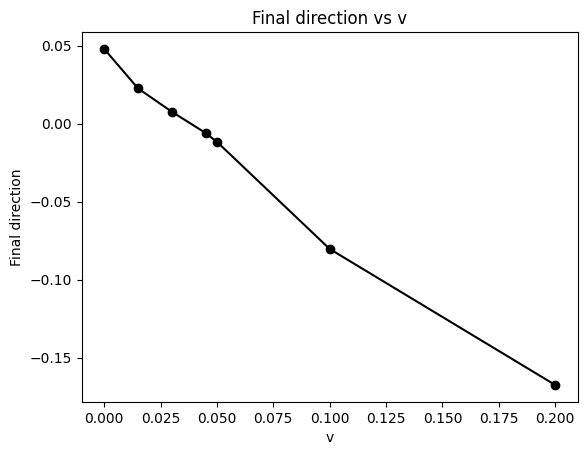

In [10]:
# # Example usage (you can replace these with your actual values)
# x = np.linspace(-10, 10, 100)
# tanh_result = [math.tanh(i) for i in x]

# plt.plot(x, tanh_result)
# # print(f"tanh({x}) = {tanh_result}")

# # For the logistic function (sigmoid)
# logistic_result = 1 / (1 + math.exp(-x))
# print(f"logistic({x}) = {logistic_result}")
#np.random.seed(100)

# parameters:
d0 = 0 #1 or 0
k = 0.1 # 6.280589249545362e-05 # 0.5 #1 impact of v in gamma (which impacts the previous stage)
a = 1 #1 # directly impact of v in ds
std1 = 0.1 #0.1 standard deviation of epsilon
std2 = 0.1 #0.1 standard deviation of gamma
mean = 0
mean1 = 0

eps = np.random.normal(loc=mean1, scale=std2)

# variables:
vs = np.array([0, 0.015, 0.03, 0.045, 0.05, 0.1, 0.2])

# function gamma
def gamma(v, k=k, mean=mean, std=std1):
    lambd = np.random.normal(loc=mean, scale=std1)
    return k*v + lambd


gammas = [gamma(i) for i in vs]

# plt.plot(vs, gammas)

def plot_gammas(trials=100000):

      gammas_all = []

      for v in vs:
          gammas_v = [gamma(v) for _ in range(trials)]
          gammas_all.append(gammas_v)

      gammas_all = np.array(gammas_all)


      for i in range(len(gammas_all)):
          plt.hist(gammas_all[i], bins=50)
          mean = round(np.mean(gammas_all[i]), 3)
          plt.axvline(mean, color='red')
          plt.title(f"Gamma distribution for v = {vs[i]} with mean = {mean}")
          plt.show()

def final_dir(v, a=a, d0=d0, s=100000):

    gamm = gamma(np.sqrt(v))
    # gamm =
    result = gamm**s * (d0 - (-a*v + eps)/(1-gamm)) + (-a*v+ eps)/(1-gamm)
    return math.tanh(result)

final_values = []
for v in vs:
    final_values.append(final_dir(v))
    #print(f"Final direction for v = {v}: {final_dir(v)}")

plt.plot(vs, final_values, marker='o', color='k')
plt.title("Final direction vs v")
plt.xlabel("v")
plt.ylabel("Final direction")
plt.show()

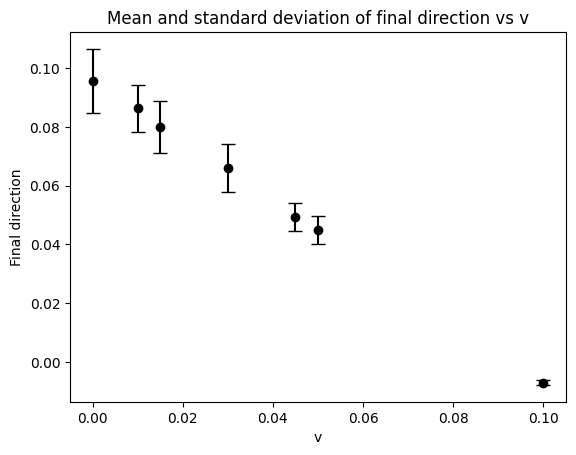

In [7]:
def plot_dss(vs=[0, 0.015, 0.03, 0.045, 0.05, 0.1, 0.01], trials=100):
    ds_all = []
    for v in vs:
        dir_v = [final_dir(v) for _ in range(trials)]
        ds_all.append(dir_v)

    ds_all = np.array(ds_all)

    all_means = np.mean(ds_all, axis=1)
    plt.errorbar(vs, all_means,
                yerr=np.std(ds_all, axis=1),
                capsize=5, fmt='o', color='k')
    # plt.plot(vs, all_means, linestyle="-", color='blue')

    plt.title("Mean and standard deviation of final direction vs v")
    plt.xlabel("v")
    plt.ylabel("Final direction")
    plt.show()


plot_dss()

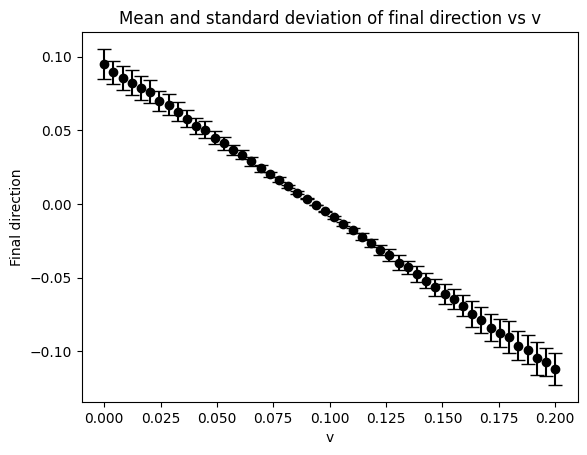

In [8]:
vs = np.linspace(0, 0.2, 50)
plot_dss(vs)

In [ ]:
def final_dir(v, d0=1, k=1, a=1, mean=0, std1=.1, std2=.2, s=1000000):

    eps = np.random.normal(loc=mean, scale=std1)
    lambd = np.random.normal(loc=mean, scale=std2)

    gamm = k*v + lambd

    result = gamm**s * (d0 - (-a*v + eps)/(1-gamm)) + (-a*v + eps)/(1-gamm)
    return result


In [ ]:

# Load your data (replace with your actual path)
df = pd.read_csv("/content/drive/MyDrive/sargent et al (2022)/cncc.csv")
df['volt'] = df['ef'] / 1000 #distance of 1e-3 m
df = df.loc[df['slice']==37]
df = df[df['track'] != 51] # remove row with cell 51 in volt=0.1 in set=1
df = df[['track', 'slice',
      'cum_dir', 'volt', 'set']]

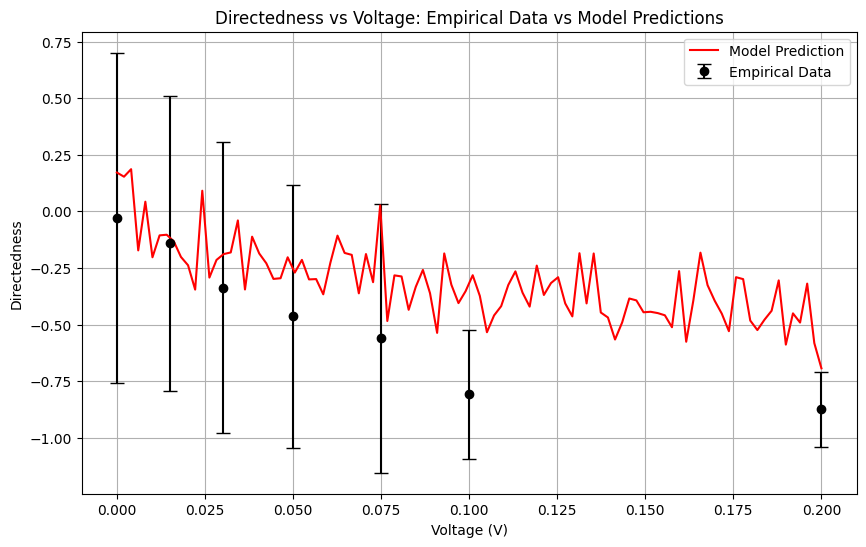

In [12]:


def final_dir(v, d0=1, k=1, a=1, mean=0, std1=.1, std2=.2, s=1000000):

    eps = np.random.normal(loc=mean, scale=std1)
    lambd = np.random.normal(loc=mean, scale=std2)

    # gamm = k*v + lambd

    # result = gamm**s * (d0 - (-a*v + eps)/(1-gamm)) + (-a*v + eps)/(1-gamm)
    # return result

    gamm = gamma(a)
    # gamm =
    result = gamm**s * (d0 - (-a* np.sqrt(v) + eps)/(1-gamm)) + (-a*np.sqrt(v)+ eps)/(1-gamm)
    return math.tanh(result)

def plot_variable_relationship(df, v_values, best_params):
    """Plots a comparison between the directedness predicted by the model
      and the experimental data

    Args:
      df (pd.DataFrame): DataFrame to use for experimental data.
      v_values (list): A list of specific voltage values for the function.
      best_params (dict): dictionary with the parameters to use in the `final_dir` equation

    Returns:

    """
    # Calculate model predictions
    model_predictions = [final_dir(v, **best_params) for v in v_values]


    # Calculate mean and standard deviation of experimental data
    volts = df['volt'].unique()
    dir_all = []
    for volt in volts:
        dir_all.append(np.array(df.loc[df['volt']==volt]['cum_dir']))

    dir_all = np.array(dir_all)
    all_means = np.mean(dir_all, axis=1)
    all_std = np.std(dir_all, axis=1)

    # Plotting
    plt.figure(figsize=(10, 6))

    # Error bars for experimental data
    plt.errorbar(volts, all_means,
                yerr=all_std,
                capsize=5, fmt='o', color='black', label='Empirical Data')

    # Plotting the model
    plt.plot(v_values, model_predictions, linestyle='-', color='red', label='Model Prediction')

    # Title and labels
    plt.title("Directedness vs Voltage: Empirical Data vs Model Predictions")
    plt.xlabel("Voltage (V)")
    plt.ylabel("Directedness")
    plt.legend()
    plt.grid(True)
    plt.show()

v_values = np.linspace(0, 0.2, 100) # same values that you used in the notebook
# Example usage after having the best parameter using the previous step
best_params = {'d0': 1.0, 'k': 1.0, 'a': 1.0, 'mean': 0.0, 'std1': 0.1, 'std2': 0.1, 's': 1000000} # you should replace those by the values you found in the previous step
plot_variable_relationship(df, v_values, best_params)

# Second Iteration: quadratic relation between intercept and voltage

In [16]:
import numpy as np
import matplotlib.pyplot as plt

# Parameters
sigma = 0.1  # Standard deviation of Gaussian noise
timesteps = 500  # Number of timesteps
V_values = np.linspace(0, 0.5, 10)  # Voltages from 0 to 0.2V
m = -0.0314  # Average slope from regression
D_0 = 10  # Initial directedness


# Quadratic function for b(V)
def b_V(V):
    return 29.81 * V**2 - 10.89 * V + 0.0029

# Simulation function
def simulate_Dt(V):
    bV = b_V(V)
    D_t = np.zeros(timesteps)

    for t in range(1, timesteps):
        # noise = np.random.normal(0, sigma)
        #sum_noise = sum(m**k * np.random.normal(0, sigma) for k in range(t))
        D_t[t] = (D_0 - bV / (1 - m)) * m**t + bV / (1 - m) # + sum_noise

    return D_t

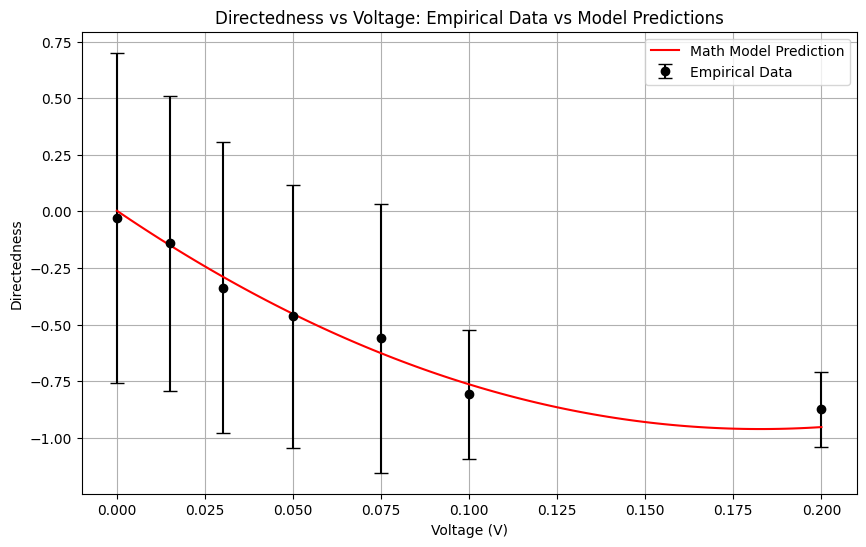

In [17]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# def final_dir(v, d0=1, k=1, a=1, mean=0, std1=.1, std2=.2, s=1000000):

#     eps = np.random.normal(loc=mean, scale=std1)
#     lambd = np.random.normal(loc=mean, scale=std2)

#     # gamm = k*v + lambd

#     # result = gamm**s * (d0 - (-a*v + eps)/(1-gamm)) + (-a*v + eps)/(1-gamm)
#     # return result

#     gamm = gamma(a)
#     # gamm =
#     result = gamm**s * (d0 - (-a* np.sqrt(v) + eps)/(1-gamm)) + (-a*np.sqrt(v)+ eps)/(1-gamm)
#     return math.tanh(result)

def plot_variable_relationship(df, v_values):
    """Plots a comparison between the directedness predicted by the model
      and the experimental data

    Args:
      df (pd.DataFrame): DataFrame to use for experimental data.
      v_values (list): A list of specific voltage values for the function.
      best_params (dict): dictionary with the parameters to use in the `final_dir` equation

    Returns:

    """
    # Calculate model predictions
    model_predictions = [simulate_Dt(v)[-1] for v in v_values]


    # Calculate mean and standard deviation of experimental data
    volts = df['volt'].unique()
    dir_all = []
    for volt in volts:
        dir_all.append(np.array(df.loc[df['volt']==volt]['cum_dir']))

    dir_all = np.array(dir_all)
    all_means = np.mean(dir_all, axis=1)
    all_std = np.std(dir_all, axis=1)

    # Plotting
    plt.figure(figsize=(10, 6))

    # Error bars for experimental data
    plt.errorbar(volts, all_means,
                yerr=all_std,
                capsize=5, fmt='o', color='black', label='Empirical Data')

    # Plotting the model
    plt.plot(v_values, model_predictions, linestyle='-', color='red', label='Math Model Prediction')

    # Title and labels
    plt.title("Directedness vs Voltage: Empirical Data vs Model Predictions")
    plt.xlabel("Voltage (V)")
    plt.ylabel("Directedness")
    plt.legend()
    plt.grid(True)
    plt.show()

v_values = np.linspace(0, 0.2, 100) # same values that you used in the notebook
# Example usage after having the best parameter using the previous step
# best_params = {'d0': 1.0, 'k': 1.0, 'a': 1.0, 'mean': 0.0, 'std1': 0.1, 'std2': 0.1, 's': 1000000} # you should replace those by the values you found in the previous step
plot_variable_relationship(df, v_values)

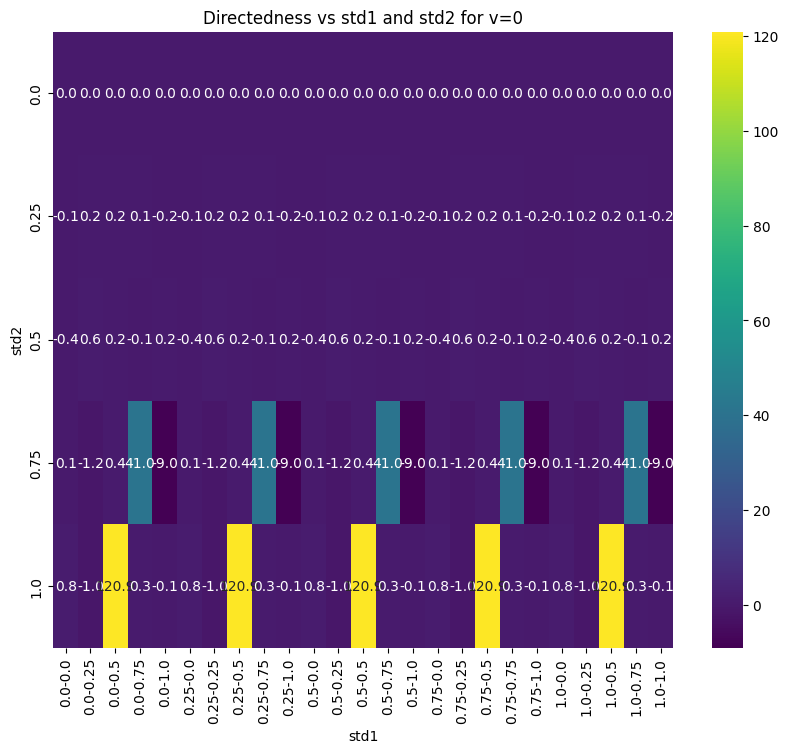

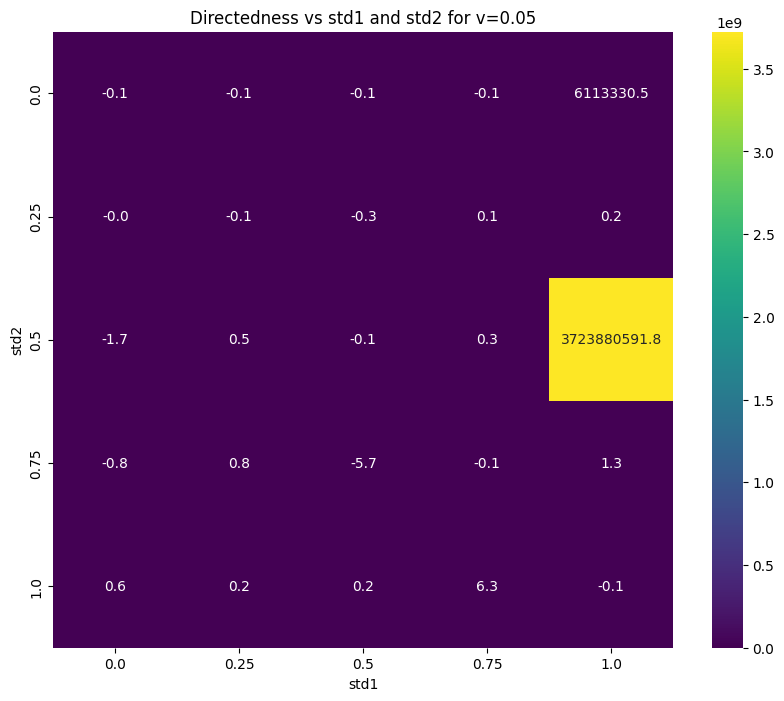

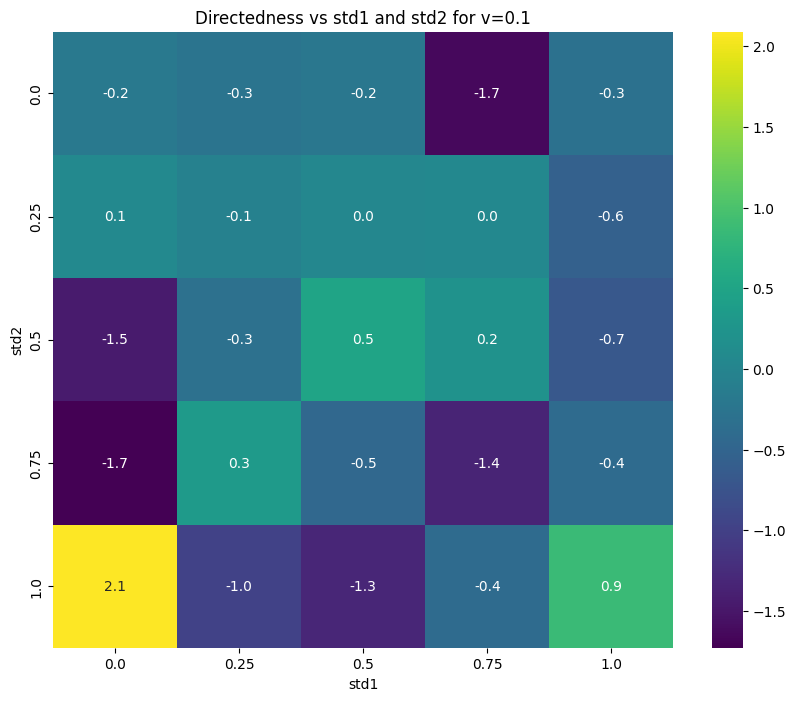

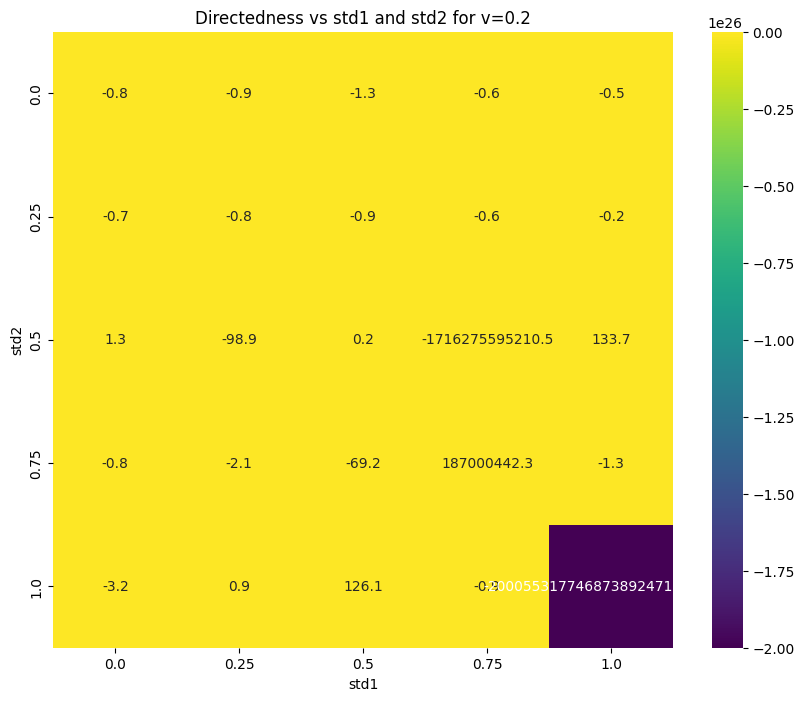

In [18]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

def final_dir(v, d0=1, k=2, a=1.5, mean=0, std1=.1, std2=.1, s=100):

    eps = np.random.normal(loc=mean, scale=std1)
    lambd = np.random.normal(loc=mean, scale=std2)

    gamm = k*v + lambd
    # print(f"lamb: {lambd}")
    # print(f"gamm: {gamm}")
    # print(f"gamm^s: {gamm**s}")

    result = gamm**s * (d0 - (-a*v + eps)/(1-gamm)) + (-a*v + eps)/(1-gamm)
    return result

def plot_parameter_heatmap(df, param1, param2, values1, values2, v_values,  d0=1, k=1, a=1, mean=0, std1=.1, std2=.1, s=100):
    """Generates a heatmap to show model output over a range of two parameters.

    Args:
      df (pd.DataFrame): DataFrame to use for empirical data (for comparison).
        param1 (str): Name of the first parameter.
        param2 (str): Name of the second parameter.
        values1 (list): Values for the first parameter.
        values2 (list): Values for the second parameter.
        v_values (list): A list of specific voltage values for the function.
    """
    # Create a grid to store results
    results = np.zeros((len(values1), len(values2),len(v_values)))

    for i, v1 in enumerate(values1):
        for j, v2 in enumerate(values2):
            for k, v_ in enumerate(v_values):
              params = {'d0': d0, 'k': k, 'a': a, 'mean': mean, 'std1': std1, 'std2': std2, 's': s}

              params[param1] = v1
              params[param2] = v2
              # Calculate the mean final_dir for the current set of parameters
              results[i, j, k] = final_dir(v_, **params)
    #create a dataframe with the results
    df_results = pd.DataFrame(
      columns = pd.MultiIndex.from_product([values1, values2], names=[param1, param2])
    )

    for k, v in enumerate(v_values):
      df_results[v] = [results[i, j, k] for j in range(len(values2)) for i in range(len(values1))]
      df_results.index = pd.MultiIndex.from_product([values1, values2], names=[param1, param2])
    #print(df_results)

    for k, v in enumerate(v_values):
      plt.figure(figsize=(10, 8))
      sns.heatmap(df_results[v].unstack(level=0), annot=True, cmap="viridis", fmt=".1f")
      plt.title(f'Directedness vs {param1} and {param2} for v={v}')
      plt.ylabel(param2)
      plt.xlabel(param1)
      plt.show()

# Define a range of values for each parameter and the voltage
values_k = np.linspace(0, 1, 5)
values_a = np.linspace(0, 1, 5)
v_values = [0, 0.05, 0.1, 0.2]


# Example of using the function:
plot_parameter_heatmap(df, "std1", "std2", values_k, values_a, v_values, d0=1, k=2, a=1.5)

<ipython-input-19-8c8accd1456c>:21: RuntimeWarning: overflow encountered in scalar power
  result = gamm**s * (d0 - (-a*v + eps)/(1-gamm)) + (-a*v + eps)/(1-gamm)
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:2294: RuntimeWarning: overflow encountered in divide
  resdat /= (vmax - vmin)
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:777: RuntimeWarning: overflow encountered in multiply
  xa *= self.N


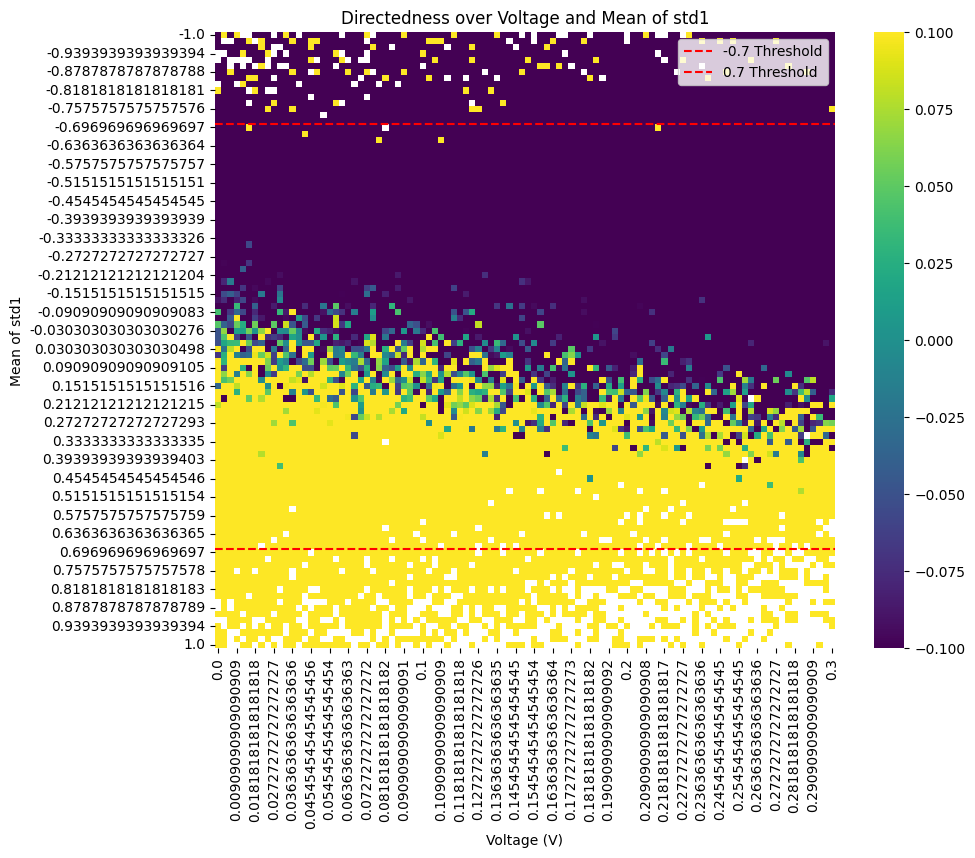

In [19]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

def final_dir(v, d0=1, k=1, a=1, mean=0, std1=.1, std2=.2, s=1000000):
    """Calculates the final direction of cell migration based on given parameters.

    Args:
      v (float): The voltage value.
      d0, k, a, mean, std1, std2, s (float): Model parameters.

    Returns:
        float: The final direction value.
    """
    eps = np.random.normal(loc=mean, scale=std1)
    lambd = np.random.normal(loc=mean, scale=std2)

    gamm = k*v + lambd

    result = gamm**s * (d0 - (-a*v + eps)/(1-gamm)) + (-a*v + eps)/(1-gamm)
    return result


def plot_directedness_heatmap(df, v_min=0, v_max=0.3, std_mean_min=-1, std_mean_max=1, num_points=100, d0=1, k=1, a=1, std2=.2, s=10000):
    """Generates a heatmap of directedness over a continuous grid of voltage and mean of std1.

    Args:
        df (pd.DataFrame): DataFrame to use for empirical data (for comparison).
        v_min (float): Minimum voltage value.
        v_max (float): Maximum voltage value.
        std_mean_min (float): Minimum value for the mean of std1.
        std_mean_max (float): Maximum value for the mean of std1.
         num_points (int): Number of points on each axis in the heatmap.
        d0, k, a, std2, s (float): Fixed model parameters.
    """
    # Create continuous ranges for x and y axis
    v_values = np.linspace(v_min, v_max, num_points)
    std_mean_values = np.linspace(std_mean_min, std_mean_max, num_points)

    # Create a grid to store directedness values
    directedness_grid = np.zeros((num_points, num_points))

    # Calculate directedness for each point in the grid
    for i, v in enumerate(v_values):
        for j, std_mean in enumerate(std_mean_values):
          directedness_grid[j, i] = final_dir(v, d0=d0, k=k, a=a, mean=std_mean, std1=0.1, std2=std2, s=s)

    # Create DataFrame for heatmap
    df_heatmap = pd.DataFrame(directedness_grid, index=std_mean_values, columns=v_values)

    # Plot heatmap
    plt.figure(figsize=(10, 8))
    sns.heatmap(df_heatmap, cmap="viridis", annot=False) # annot=False to avoid annotation in each grid
    plt.title('Directedness over Voltage and Mean of std1')
    plt.xlabel('Voltage (V)')
    plt.ylabel('Mean of std1')

    # Add lines to mark boundaries
    plt.axhline(y=find_y_index(df_heatmap.index, -0.7), color='red', linestyle='--', label='-0.7 Threshold')
    plt.axhline(y=find_y_index(df_heatmap.index, 0.7), color='red', linestyle='--', label='0.7 Threshold')
    plt.legend()
    plt.show()


def find_y_index(index, value):
    """Find the index of the closest value in a index to a target value"""
    return np.argmin(np.abs(index - value))


# Example of using the function:
plot_directedness_heatmap(df)

## Relation between previous and further directedness given the voltage


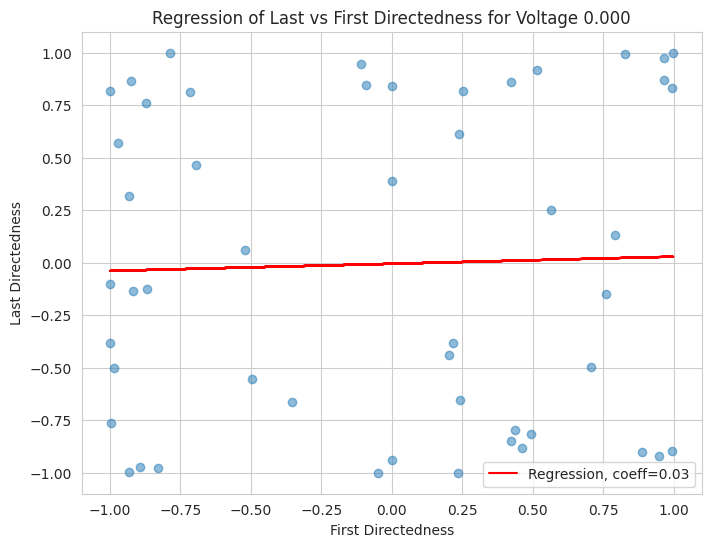

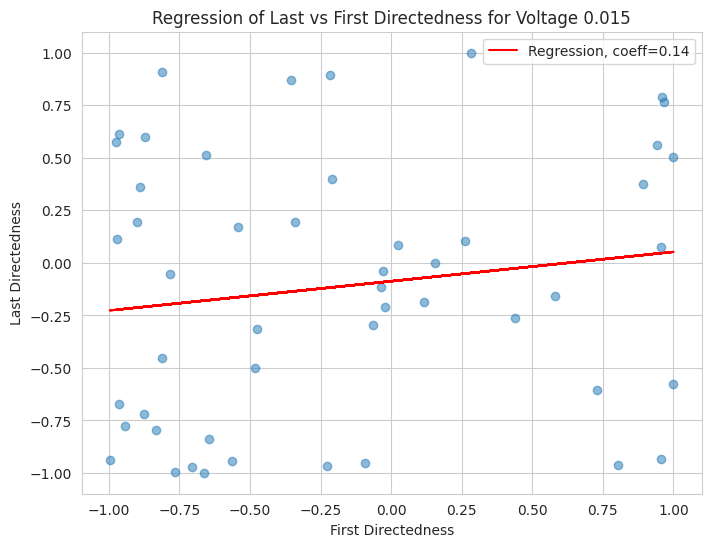

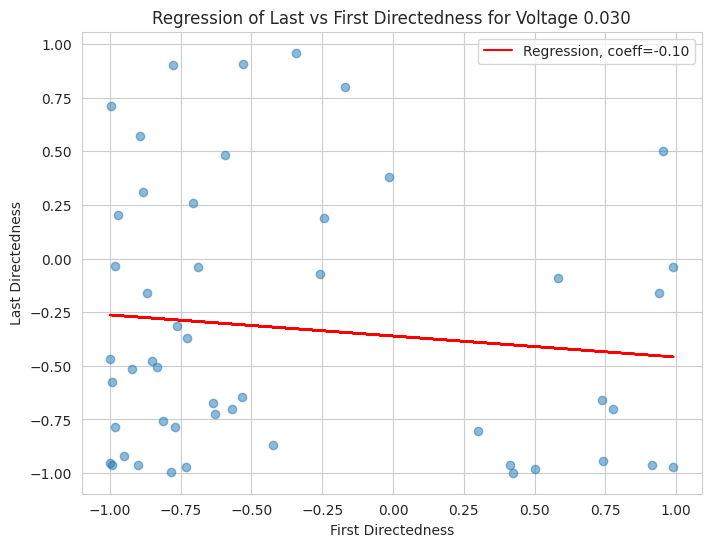

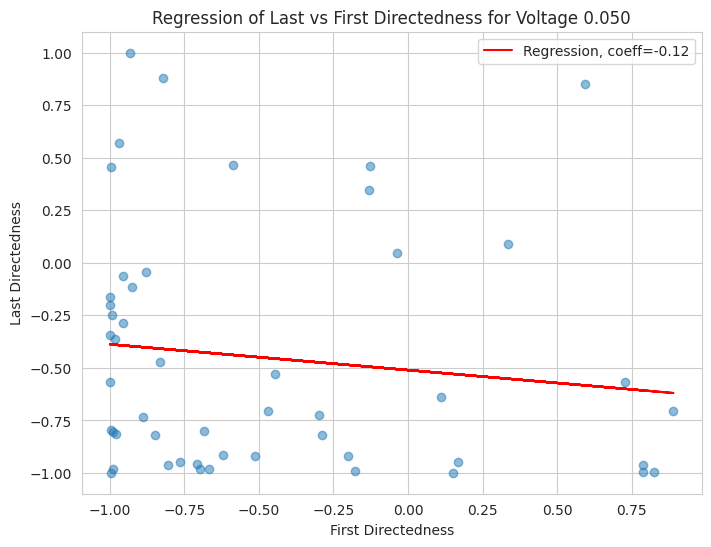

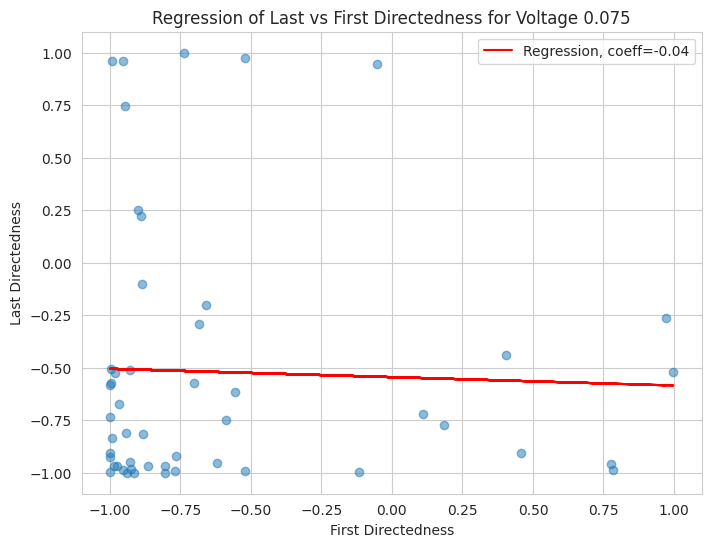

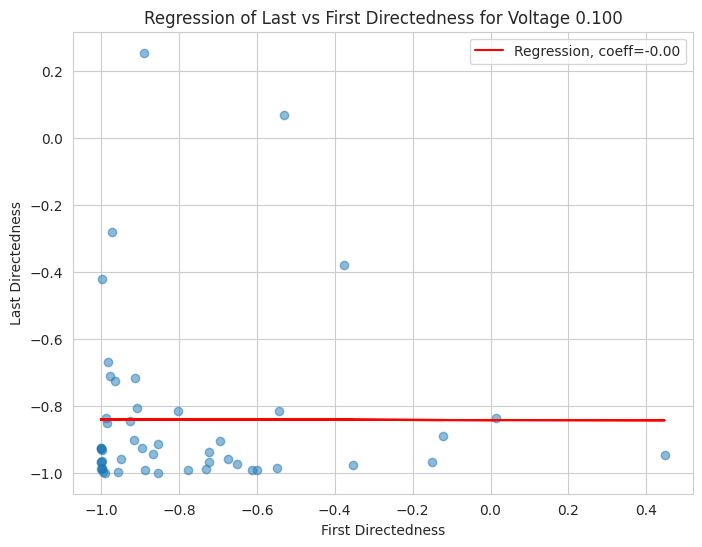

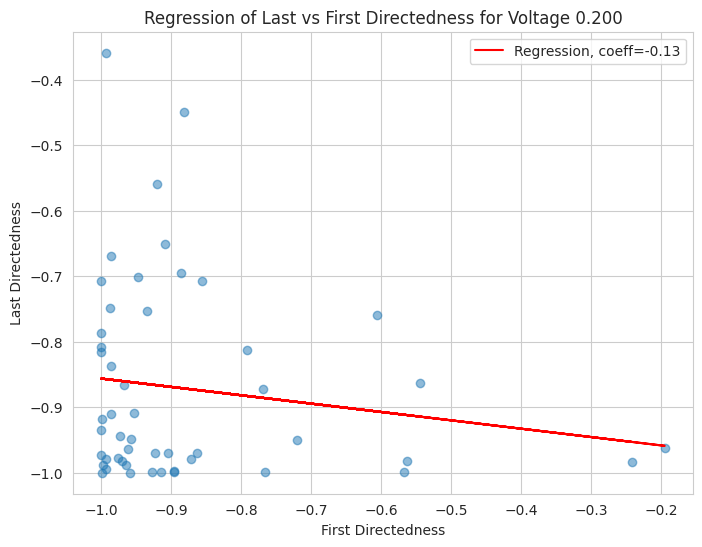

Mean Coefficient: -0.031
All Coefficients: {0.0: 0.033994723105794156, 0.015: 0.13951042296008412, 0.03: -0.09829448224807978, 0.05: -0.12267023037107795, 0.075: -0.039864711191786195, 0.1: -0.001651653862314316, 0.2: -0.12759774852701003}


In [30]:
# import numpy as np
# import pandas as pd
# import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression

# # Load your data
# df = pd.read_csv("/content/drive/MyDrive/sargent et al (2022)/cncc.csv")
# df['volt'] = df['ef'] / 1000  # distance of 1e-3 m
# df = df.loc[df['slice'] == 37]
# df = df[df['track'] != 51]  # remove row with cell 51 in volt=0.1 in set=1
# df = df[['track', 'slice', 'cum_dir', 'volt', 'set']]


def plot_and_save_coefficients(df):
    """
    Plots regression lines and saves coefficients for different voltage values
    between the first and the last directedness of each cell.

    Args:
        df (pd.DataFrame): DataFrame containing the data.

    Returns:
        dict: Dictionary containing the regression coefficients for each voltage value.
    """
    voltage_values = df['volt'].unique()
    all_coefficients = {}

    for v in voltage_values:
        df_v = df[df['volt'] == v].copy()
        df_v.sort_values(by=['track', 'slice'], inplace=True)

        first_dirs = []
        last_dirs = []

        for track, track_data in df_v.groupby('track'):
            track_data = track_data.reset_index(drop=True)
            if len(track_data) > 1:
                first_dirs.append(track_data['cum_dir'].iloc[0])
                last_dirs.append(track_data['cum_dir'].iloc[-1])
            else:
                first_dirs.append(np.nan)
                last_dirs.append(np.nan)

        df_v_filtered = pd.DataFrame({'first_dir': first_dirs, 'last_dir': last_dirs})
        df_v_filtered = df_v_filtered.dropna(subset=['first_dir', 'last_dir'])

        if len(df_v_filtered) > 1:
            # Linear regression
            model = LinearRegression()
            model.fit(df_v_filtered[['first_dir']], df_v_filtered['last_dir'])
            coefficient = model.coef_[0]

            # Plotting
            plt.figure(figsize=(8, 6))
            plt.scatter(df_v_filtered['first_dir'], df_v_filtered['last_dir'], alpha=0.5)
            plt.plot(df_v_filtered['first_dir'], model.predict(df_v_filtered[['first_dir']]), color='red',
                     label=f'Regression, coeff={coefficient:.2f}')

            plt.title(f'Regression of Last vs First Directedness for Voltage {v:.3f}')
            plt.xlabel('First Directedness')
            plt.ylabel('Last Directedness')
            plt.legend()
            plt.grid(True)
            plt.show()

            all_coefficients[v] = coefficient
        else:
             all_coefficients[v] = np.nan
             print(f"Not enough data points for voltage = {v}")
    # Calculate mean or weighted mean of coefficients
    mean_coefficient = np.nanmean(list(all_coefficients.values()))
    print(f"Mean Coefficient: {mean_coefficient:.3f}")
    return all_coefficients


# Example usage
all_coefficients = plot_and_save_coefficients(df)
print("All Coefficients:", all_coefficients)

<ipython-input-31-19ce4247081b>:24: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('viridis', len(voltage_values))  # Color map for different voltages
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:273

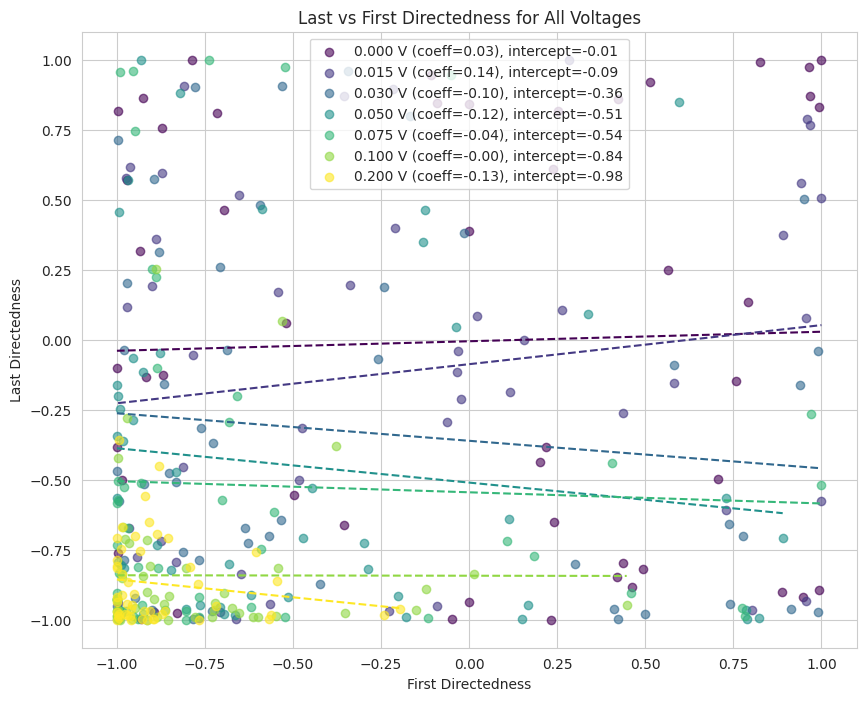

In [31]:
# import numpy as np
# import pandas as pd
# import matplotlib.pyplot as plt
# from sklearn.linear_model import LinearRegression

# # Load your data
# df = pd.read_csv("/content/drive/MyDrive/sargent et al (2022)/cncc.csv")
# df['volt'] = df['ef'] / 1000  # distance of 1e-3 m
# df = df.loc[df['slice'] == 37]
# df = df[df['track'] != 51]  # remove row with cell 51 in volt=0.1 in set=1
# df = df[['track', 'slice', 'cum_dir', 'volt', 'set']]
sns.set_style("whitegrid")

def plot_all_voltages(df):
    """
    Plots the first vs. last directedness for all cells on the same plot,
    using color coding and legend for different voltage values.

    Args:
        df (pd.DataFrame): DataFrame containing the data.
    """
    voltage_values = df['volt'].unique()
    colors = plt.cm.get_cmap('viridis', len(voltage_values))  # Color map for different voltages
    plt.figure(figsize=(10, 8))


    slopes = []
    intercepts = []
    for i, v in enumerate(voltage_values):
        df_v = df[df['volt'] == v].copy()
        df_v.sort_values(by=['track', 'slice'], inplace=True)

        first_dirs = []
        last_dirs = []

        for track, track_data in df_v.groupby('track'):
            track_data = track_data.reset_index(drop=True)
            if len(track_data) > 1:
                first_dirs.append(track_data['cum_dir'].iloc[0])
                last_dirs.append(track_data['cum_dir'].iloc[-1])
            else:
                first_dirs.append(np.nan)
                last_dirs.append(np.nan)
        df_v_filtered = pd.DataFrame({'first_dir': first_dirs, 'last_dir': last_dirs})
        df_v_filtered = df_v_filtered.dropna(subset=['first_dir', 'last_dir'])

        if len(df_v_filtered) > 1:
            # Linear regression
            model = LinearRegression()
            model.fit(df_v_filtered[['first_dir']], df_v_filtered['last_dir'])
            coefficient = model.coef_[0]
            intercept = model.intercept_

            slopes.append(coefficient)
            intercepts.append(intercept)

            # Plotting
            plt.scatter(df_v_filtered['first_dir'], df_v_filtered['last_dir'],
                        alpha=0.6, label=f'{v:.3f} V (coeff={coefficient:.2f}), intercept={intercept:.2f}', color=colors(i))

            # Adding regression line
            x_values = np.linspace(df_v_filtered['first_dir'].min(), df_v_filtered['first_dir'].max(), 100)
            plt.plot(x_values, model.predict(x_values.reshape(-1,1)), color=colors(i), linestyle='--')

    plt.title('Last vs First Directedness for All Voltages')
    plt.xlabel('First Directedness')
    plt.ylabel('Last Directedness')
    plt.legend()
    plt.grid(True)
    plt.show()

    return slopes, intercepts


# Example usage
slopes, intercepts = plot_all_voltages(df)



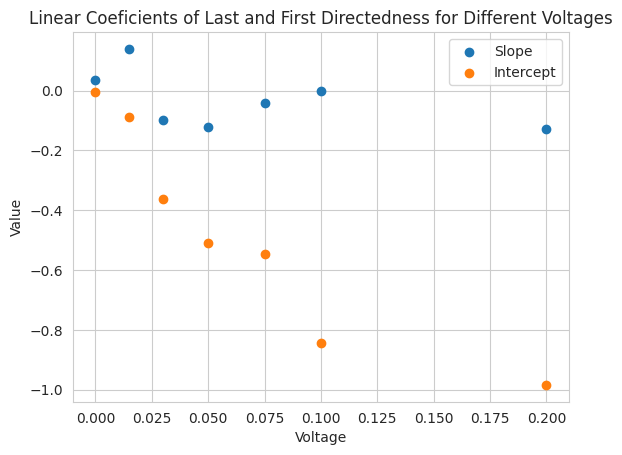

In [32]:
voltage_values = df['volt'].unique()

plt.scatter(voltage_values, slopes, label='Slope')
plt.scatter(voltage_values, intercepts, label='Intercept')
plt.title('Linear Coeficients of Last and First Directedness for Different Voltages')
plt.xlabel('Voltage')
plt.ylabel('Value')
plt.legend()
plt.show()

Intercept: -0.1477317928026456
Slope: -4.896666543388606


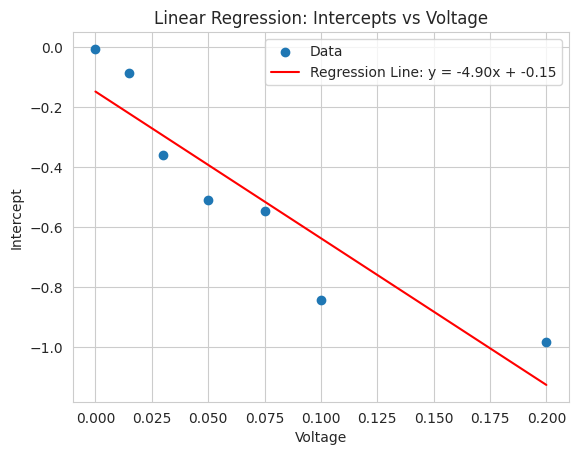

In [35]:
def linear_regression_for_intercepts(voltage_values, intercepts):
    """
    Performs a linear regression on the provided intercepts vs. voltage values.

    Args:
        voltage_values (array-like): List or array of voltage values (independent variable).
        intercepts (array-like): List or array of intercept values (dependent variable).

    Returns:
        tuple: A tuple containing the intercept and slope of the regression line.
    """
    model = LinearRegression()
    X = np.array(voltage_values).reshape(-1, 1)  # Reshape for single feature
    model.fit(X, intercepts)
    intercept = model.intercept_
    slope = model.coef_[0]
    return intercept, slope


# Prepare data for linear regression
voltage_values = df['volt'].unique()

# Perform linear regression
intercept, slope = linear_regression_for_intercepts(voltage_values, intercepts)
print(f"Intercept: {intercept}")
print(f"Slope: {slope}")


# Plotting
plt.scatter(voltage_values, intercepts, label='Data')
X = np.array(voltage_values).reshape(-1, 1)
plt.plot(X, intercept + slope * X, color='red', label=f'Regression Line: y = {slope:.2f}x + {intercept:.2f}')
plt.title('Linear Regression: Intercepts vs Voltage')
plt.xlabel('Voltage')
plt.ylabel('Intercept')
plt.legend()
plt.grid(True)
plt.show()

Coefficients of the quadratic regression for slopes:
[[  0.         -11.01705668  30.27147859]]


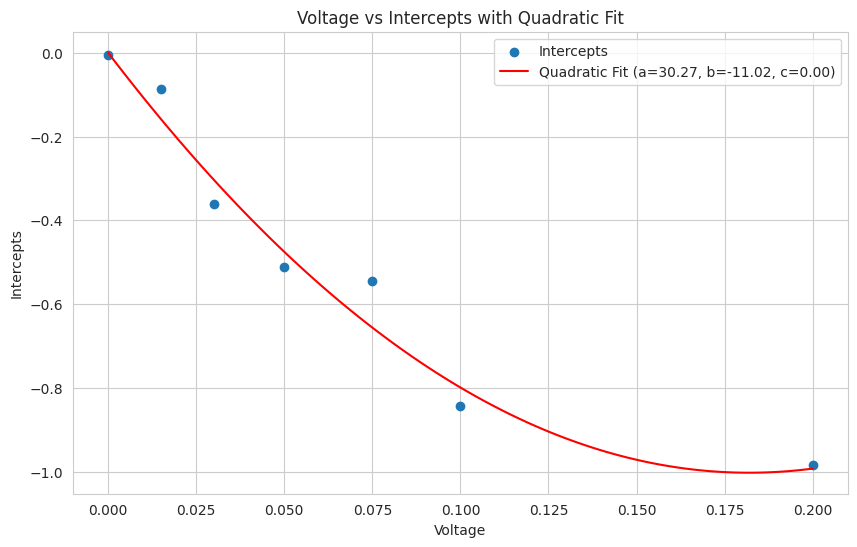

In [38]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline


def quadratic_regression_for_slopes(voltage_values, intercepts):
    """
    Calculates regression coefficients (slopes and intercepts) for each voltage
    and fits a quadratic regression to the relationship between voltage and slopes.
    It then outputs the coefficients of the quadratic regression.
    """
    # Quadratic regression for slopes
    if len(voltage_values) > 1:
        # Reshape the data to a 2D array
        voltage_values_2d = np.array(voltage_values).reshape(-1, 1)
        intercepts_2d = np.array(intercepts).reshape(-1, 1)

        # model_coefficient_poly = make_pipeline(LinearRegression(), LinearRegression())
        model_coefficient_poly = make_pipeline(PolynomialFeatures(2), LinearRegression())
        model_coefficient_poly.fit(voltage_values_2d, intercepts_2d)

        print("Coefficients of the quadratic regression for slopes:")
        print(model_coefficient_poly.named_steps.linearregression.coef_)


        # Get the coefficients
        c, b, a  = model_coefficient_poly.named_steps.linearregression.coef_[0]

        # Generate points to plot the curve
        x_range = np.linspace(min(voltage_values), max(voltage_values), 100)
        y_range = a * x_range**2 + b * x_range + c


        # Create the plot
        plt.figure(figsize=(10, 6))
        plt.scatter(voltage_values, intercepts, label='Intercepts')
        plt.plot(x_range, y_range, color='red', label=f'Quadratic Fit (a={a:.2f}, b={b:.2f}, c={c:.2f})')

        plt.title('Voltage vs Intercepts with Quadratic Fit')
        plt.xlabel('Voltage')
        plt.ylabel('Intercepts')
        plt.legend()
        plt.grid(True)
        plt.show()

    else:
        print("Not enough data to perform the quadratic regression")




# Example usage
quadratic_regression_for_slopes(voltage_values, intercepts)

## Different Fitting relations between intercept and voltage

RMSE values: {'Linear': 0.12956011340444096, 'Quadratic': 0.05858695817152055, 'Cubic': 0.05857398481988016, 'Quartic': 0.05408083893242201, 'Exponential': 0.1832773528565926, 'Logistic': 0.07936854344693854}
Best-fitting equation: Quartic


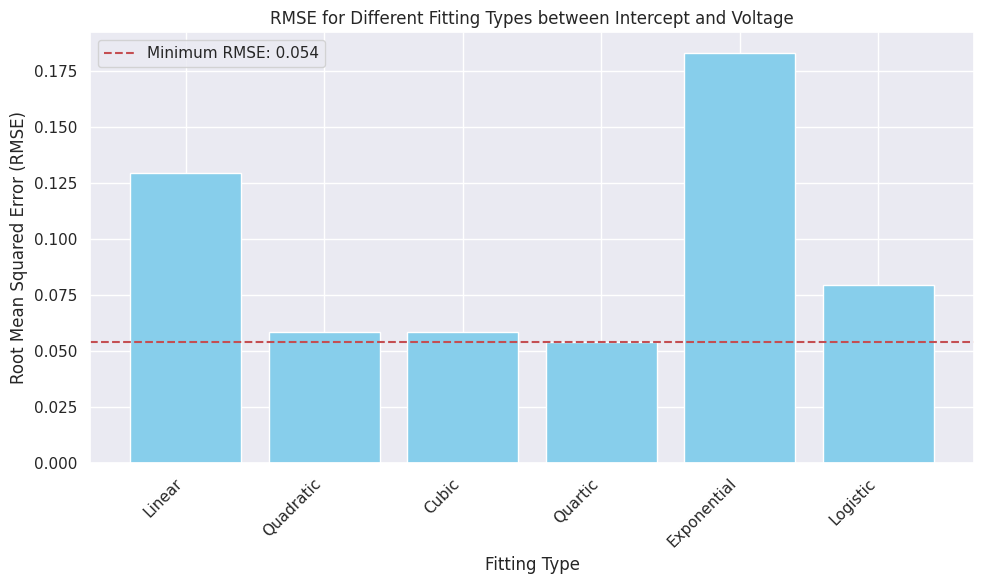

0.07097315523292042


In [92]:
import numpy as np
from scipy.optimize import curve_fit

# Given data points
V_values = np.array([0.000, 0.015, 0.030, 0.050, 0.075, 0.100, 0.200])
b_values = np.array([-0.01, -0.09, -0.36, -0.51, -0.54, -0.84, -0.98])

# Define fitting functions
def linear(V, c, d):
    return c * V + d

def quadratic(V, a, c, d):
    return a * V**2 + c * V + d

def cubic(V, a, b, c, d):
    return a * V**3 + b * V**2 + c * V + d


def quartic(V, a, b, c, d, e):
    return a * V**4 + b * V**3 + c * V**2 + d * V + e

def exponential(V, a, b):
    return a * np.exp(b * V)

def exponential(V, a, b):
    return a * np.exp(b * V)

def logistic(V, a, b, c):
    return a / (1 + np.exp(-b * (V - c)))



# Fit data to models
popt_linear, _ = curve_fit(linear, V_values, b_values)
popt_quadratic, _ = curve_fit(quadratic, V_values, b_values)
popt_cubic, _ = curve_fit(cubic, V_values, b_values)
popt_quartic, _ = curve_fit(quartic, V_values, b_values)
popt_exponential, _ = curve_fit(exponential, V_values, b_values)
popt_logistic, _ = curve_fit(logistic, V_values, b_values)


# Compute predictions
b_pred_linear = linear(V_values, *popt_linear)
b_pred_quadratic = quadratic(V_values, *popt_quadratic)
b_pred_cubic = cubic(V_values, *popt_cubic)
b_pred_quartic = quartic(V_values, *popt_quartic)
b_pred_exponential = exponential(V_values, *popt_exponential)
b_pred_logistic = logistic(V_values, *popt_logistic)


# Compute RMSE for each model
rmse_linear = np.sqrt(np.mean((b_values - b_pred_linear) ** 2))
rmse_quadratic = np.sqrt(np.mean((b_values - b_pred_quadratic) ** 2))
rmse_cubic = np.sqrt(np.mean((b_values - b_pred_cubic) ** 2))
rmse_quartic = np.sqrt(np.mean((b_values - b_pred_quartic) ** 2))
rmse_exponential = np.sqrt(np.mean((b_values - b_pred_exponential) ** 2))
rmse_logistic = np.sqrt(np.mean((b_values - b_pred_logistic) ** 2))


# Determine the best fit
rmse_results = {
    "Linear": rmse_linear,
    "Quadratic": rmse_quadratic,
    "Cubic": rmse_cubic,
    "Quartic": rmse_quartic,
    "Exponential": rmse_exponential,
    "Logistic": rmse_logistic
}

best_fit = min(rmse_results, key=rmse_results.get)

print("RMSE values:", rmse_results)
print("Best-fitting equation:", best_fit)


# Prepare data for plotting
labels = list(rmse_results.keys())
rmse_values = list(rmse_results.values())

# Plotting the bar chart
plt.figure(figsize=(10, 6))
plt.bar(labels, rmse_values, color='skyblue')
plt.xlabel('Fitting Type')
plt.ylabel('Root Mean Squared Error (RMSE)')
plt.title('RMSE for Different Fitting Types between Intercept and Voltage')
plt.axhline(y=min(rmse_values), color='r', linestyle='--', label=f'Minimum RMSE: {min(rmse_values):.3f}')
plt.legend()
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

print(rmse_linear - rmse_quadratic)

(700, 12)
[0.    0.015 0.03  0.05  0.075 0.1   0.2  ]
700


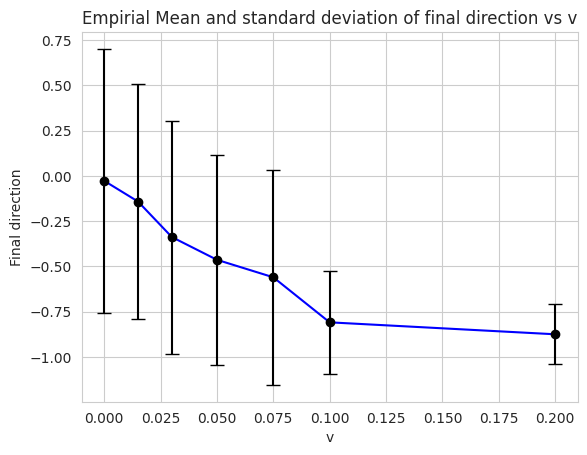

In [42]:
import pandas as pd

df = pd.read_csv("/content/drive/MyDrive/sargent et al (2022)/cncc.csv")
df['volt'] = df['ef'] / 1000 #distance of 1e-3 m

df = df.loc[df['slice']==37]
# df2 = df.loc[df['set']==2]
# df = df.loc[df['set']==1]



df = df[df['track'] != 51] # remove row with cell 51 in volt=0.1 in set=1
# print(df[(df['volt']==0.1) & (df['set']==1)])
print(df.shape)
# print(df2.shape)
df = df[['track', 'slice',
      'cum_dir', 'volt', 'set']]

print(df['volt'].unique())
print(df['track'].count())

# angle_radians = np.arctan2(np.diff(df['y']), np.diff(df['x']))
# print(angle_radians)
# df['angle'] = np.insert(angle_radians, 0, 0)
df

volts = df['volt'].unique()

dir_all = []
for volt in volts:
    dir_all.append(np.array(df.loc[df['volt']==volt]['cum_dir']))

# dir_all

dir_all = np.array(dir_all)
dir_all.shape

all_means = np.mean(dir_all, axis=1)
plt.errorbar(volts, all_means,
            yerr=np.std(dir_all, axis=1),
            capsize=5, fmt='o', color='k')
plt.plot(volts, all_means, linestyle="-", color='blue')

# plt.xticks(volts)
plt.title("Empirial Mean and standard deviation of final direction vs v")
plt.xlabel("v")
plt.ylabel("Final direction")
plt.show()

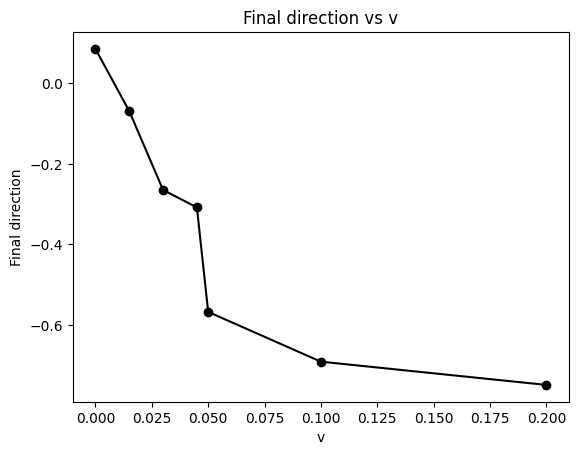

In [ ]:
# prompt: import the library so that I can use tanh or logisitic functions

import math
import numpy as np
import matplotlib.pyplot as plt


# parameters:
d0 = 0 #1 or 0
# k = 0.1 # 6.280589249545362e-05 # 0.5 #1 impact of v in gamma (which impacts the previous stage)
# a = 1 #1 # directly impact of v in ds
std1 = 0.1 #0.1 standard deviation of epsilon
std2 = 0.1 #0.1 standard deviation of gamma
mean = 0
mean1 = 0

# eps = np.random.normal(loc=mean1, scale=std2)

# variables:
vs = np.array([0, 0.015, 0.03, 0.045, 0.05, 0.1, 0.2])

# # function gamma
# def gamma(v, k=k, mean=mean, std=std1):
#     lambd = np.random.normal(loc=mean, scale=std1)
#     return k*v + lambd


# gammas = [gamma(i) for i in vs]

# plt.plot(vs, gammas)

# def plot_gammas(trials=100000):

#       gammas_all = []

#       for v in vs:
#           gammas_v = [gamma(v) for _ in range(trials)]
#           gammas_all.append(gammas_v)

#       gammas_all = np.array(gammas_all)


#       for i in range(len(gammas_all)):
#           plt.hist(gammas_all[i], bins=50)
#           mean = round(np.mean(gammas_all[i]), 3)
#           plt.axvline(mean, color='red')
#           plt.title(f"Gamma distribution for v = {vs[i]} with mean = {mean}")
# #           plt.show()

def final_dir(v, a=a, d0=d0, t=100000):
    # noise = np.random.normal(loc=mean1, scale=std2)

    result = (-.0314)**t * d0 + (29.81*v**2 - 10.89*v + 0.019)*(1 - (-0.0314)**t)/(1+0.0314)
    # 1) attempt # result = math.tanh((d0 - (-4.86*v - 0.15)/(1.031))*(-0.031)**t + (-4.86*v-0.15)/(1.031) + noise)
    return result

final_values = []
for v in vs:
    # final_values.append(final_dir(v))
    final_values.append(simulate_Dt(v)[-1])
    #print(f"Final direction for v = {v}: {final_dir(v)}")

plt.plot(vs, final_values, marker='o', color='k')
plt.title("Final direction vs v")
plt.xlabel("v")
plt.ylabel("Final direction")
plt.show()



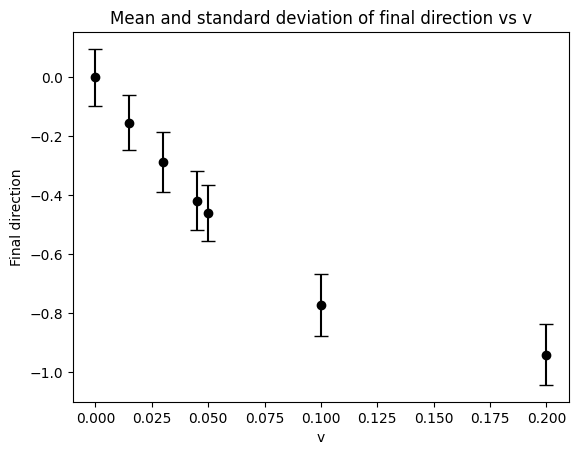

In [ ]:
def plot_dss(vs=[0, 0.015, 0.03, 0.045, 0.05, 0.1, 0.2], trials=100):
    ds_all = []
    for v in vs:
        dir_v = [simulate_Dt(v)[-1] for _ in range(trials)]
        ds_all.append(dir_v)

    ds_all = np.array(ds_all)

    all_means = np.mean(ds_all, axis=1)
    plt.errorbar(vs, all_means,
                yerr=np.std(ds_all, axis=1),
                capsize=5, fmt='o', color='k')
    # plt.plot(vs, all_means, linestyle="-", color='blue')

    plt.title("Mean and standard deviation of final direction vs v")
    plt.xlabel("v")
    plt.ylabel("Final direction")
    plt.show()


plot_dss()

In [ ]:
import numpy as np
from scipy.optimize import curve_fit

# Voltage values from the scatter plot legend
voltages = np.array([0.000, 0.015, 0.030, 0.050, 0.075, 0.100, 0.200])

# Corresponding intercept values from the scatter plot legend
intercepts = np.array([-0.01, -0.09, -0.36, -0.51, -0.54, -0.84, -0.98])

# Define a quadratic function to fit
def quadratic(V, alpha, beta, gamma):
    return alpha * V**2 + beta * V + gamma

# Fit the quadratic curve
params, _ = curve_fit(quadratic, voltages, intercepts)

# Extract the coefficients
alpha, beta, gamma = params
alpha, beta, gamma


(29.80681631815422, -10.88561234535565, 0.002883404206874923)

## Plausibility Analysis

Simulating for V = 0.0
Simulating for V = 0.05555555555555555
Simulating for V = 0.1111111111111111
Simulating for V = 0.16666666666666666
Simulating for V = 0.2222222222222222
Simulating for V = 0.2777777777777778
Simulating for V = 0.3333333333333333
Simulating for V = 0.38888888888888884
Simulating for V = 0.4444444444444444
Simulating for V = 0.5


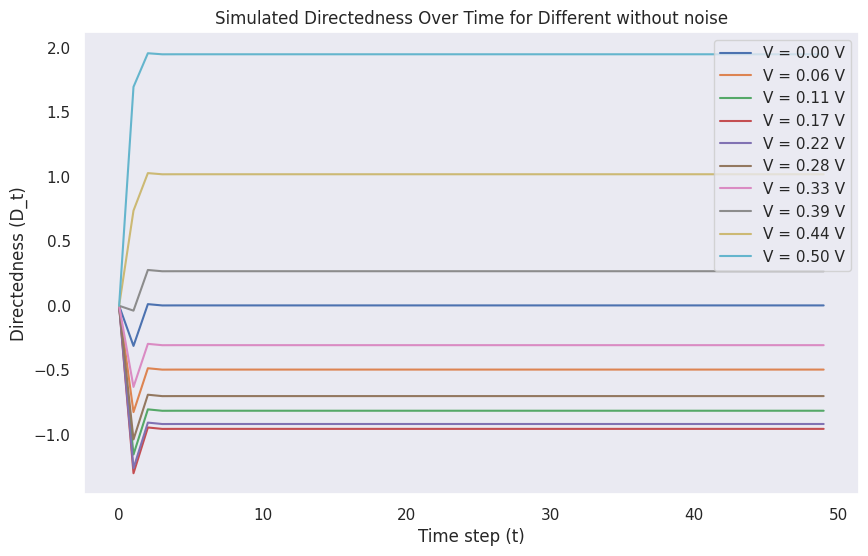

In [51]:
import numpy as np
import matplotlib.pyplot as plt

# Parameters
sigma = 0.1  # Standard deviation of Gaussian noise
timesteps = 50  # Number of timesteps
V_values = np.linspace(0, 0.5, 10)  # Voltages from 0 to 0.2V
m = -0.0314  # Average slope from regression
D_0 = 10  # Initial directedness


# Quadratic function for b(V)
def b_V(V):
    return 29.81 * V**2 - 10.89 * V + 0.0029

# Simulation function
def simulate_Dt(V):
    bV = b_V(V)
    D_t = np.zeros(timesteps)

    #noises = []

    for t in range(1, timesteps):
        # noise = np.random.normal(0, sigma)
        # sum_noise = sum(m**k * np.random.normal(0, sigma) for k in range(t))
        # noises.append(sum_noise)
        D_t[t] = (D_0 - bV / (1 - m)) * m**t + bV / (1 - m) #+ sum_noise

    return D_t#, noises

# Plot results
plt.figure(figsize=(10, 6))

# noises_all = []
for V in V_values:
    print(f"Simulating for V = {V}")
    D_t_values = simulate_Dt(V)

    # D_t_values, summed_noise = simulate_Dt(V)

    # noises_all.append(summed_noise)
    plt.plot(range(timesteps), D_t_values, label=f'V = {V:.2f} V')

plt.xlabel('Time step (t)')
plt.ylabel('Directedness (D_t)')
plt.title('Simulated Directedness Over Time for Different without noise')
plt.legend()
plt.grid()
plt.show()

# print(noises_all)
# for V, i in zip(V_values, range(len(noises_all))):
#     plt.plot(noises_all[i], label=f'V = {V:.2f} V, mean={np.mean(noises_all[i])}')
#     plt.axhline(y=0, color='r', linestyle='--')
#     plt.axhline(y=np.mean(noises_all[i]), color='g', linestyle='--')
#     plt.xlabel('Time step (t)')
#     plt.ylabel('Noise')
#     plt.title('Simulated Noise Over Time for Different Voltages')
#     plt.legend()
#       # plt.plot(noise for noise in noises)
#     plt.show()

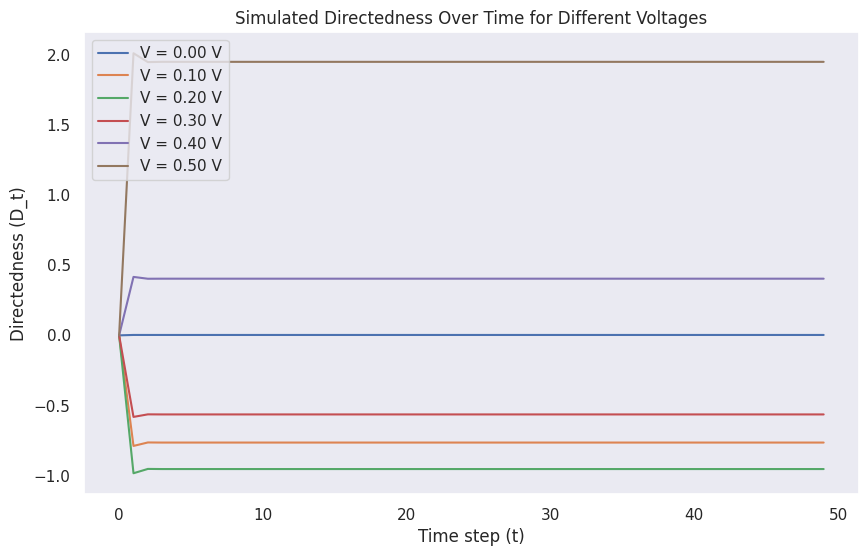


Performing Plausibility Checks...
Plausibility checks completed.


In [52]:
import numpy as np
import matplotlib.pyplot as plt

# Parameters
sigma = 0.1  # Standard deviation of Gaussian noise
timesteps = 50  # Number of timesteps
V_values = np.linspace(0, 0.5, 6)  # Voltages from 0 to 0.2V
m = -0.0314  # Average slope from regression
D_0 = 0  # Initial directedness

# Quadratic function for b(V)
def b_V(V):
    return 29.81 * V**2 - 10.89 * V + 0.0029

# Simulation function
def simulate_Dt(V):
    bV = b_V(V)
    D_t = np.zeros(timesteps)

    for t in range(1, timesteps):
        noise = np.random.normal(0, sigma)
        sum_noise = sum(m**k * np.random.normal(0, sigma) for k in range(t))
        D_t[t] = (D_0 - bV / (1 - m)) * m**t + bV / (1 - m) #+ sum_noise

    return D_t

# Plausibility checks
def plausibility_checks():
    print("\nPerforming Plausibility Checks...")
    for V in V_values:
        D_t_values = simulate_Dt(V)

        # Check directedness bounds
        if np.any(D_t_values < -1) or np.any(D_t_values > 1):
            print(f"Warning: D_t out of bounds for V={V:.2f}V")

        # Check convergence behavior
        if abs(D_t_values[-1] - D_t_values[-2]) > 0.1:
            print(f"Warning: D_t may not be converging for V={V:.2f}V")
    print("Plausibility checks completed.")

# Plot results
plt.figure(figsize=(10, 6))
for V in V_values:
    D_t_values = simulate_Dt(V)
    plt.plot(range(timesteps), D_t_values, label=f'V = {V:.2f} V')

plt.xlabel('Time step (t)')
plt.ylabel('Directedness (D_t)')
plt.title('Simulated Directedness Over Time for Different Voltages')
plt.legend()
plt.grid()
plt.show()

# Run plausibility checks
plausibility_checks()



Performing Plausibility Checks...
Plausibility checks completed.

Checking Convergence and Stability...
D_t appears to be converging for V=0.00V
D_t appears to be converging for V=0.05V
D_t appears to be converging for V=0.10V
D_t appears to be converging for V=0.15V
D_t appears to be converging for V=0.20V


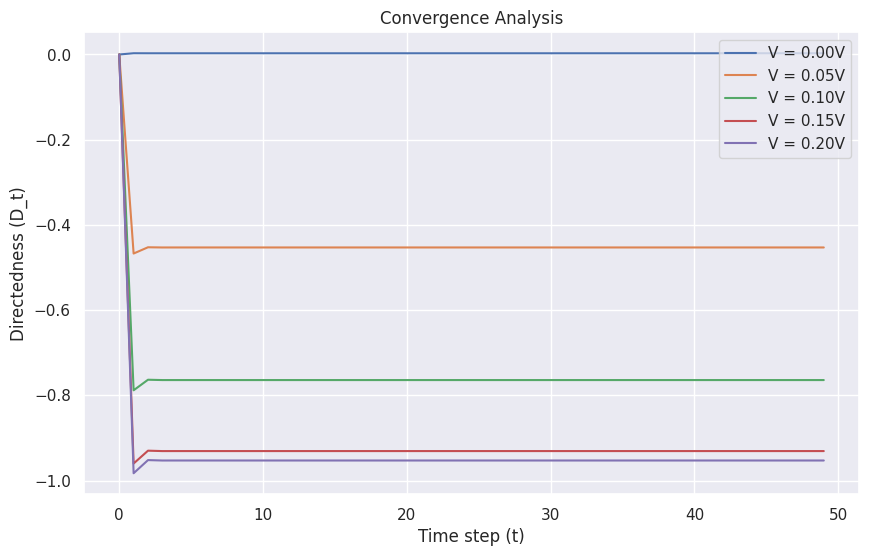


Performing Sensitivity Analysis...
Testing m = -0.0514
Testing m = -0.0414
Testing m = -0.0314
Testing m = -0.0214
Testing m = -0.0114


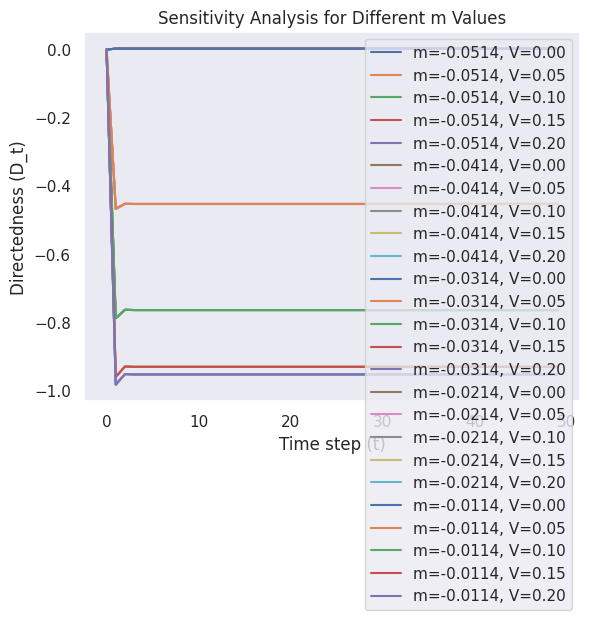


Running Monte Carlo Simulation for V=0.10V...


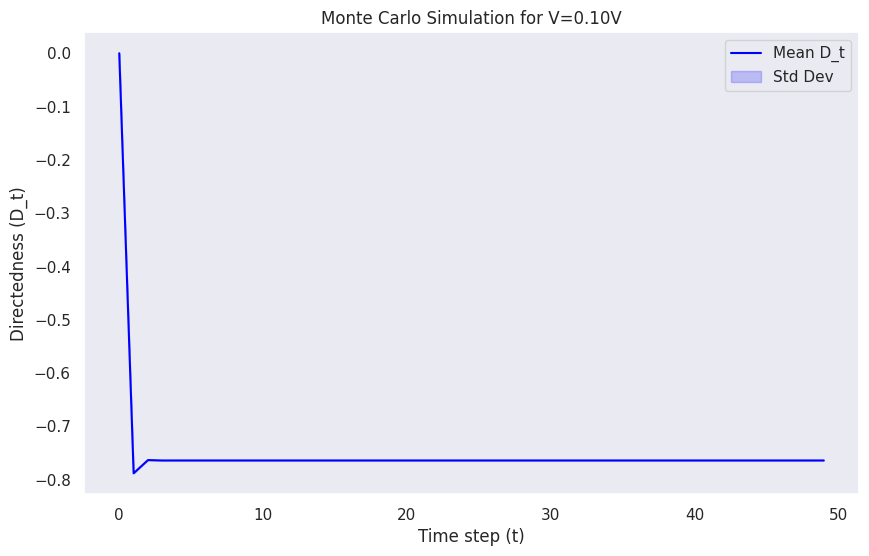

In [53]:
import numpy as np
import matplotlib.pyplot as plt

# Parameters
sigma = 0.1  # Standard deviation of Gaussian noise
timesteps = 50  # Number of timesteps
V_values = np.linspace(0, 0.2, 5)  # Voltages from 0 to 0.2V
m = -0.0314  # Average slope from regression
D_0 = 0  # Initial directedness

# Quadratic function for b(V)
def b_V(V):
    return 29.81 * V**2 - 10.89 * V + 0.0029

# Simulation function
def simulate_Dt(V, m_coef=m):
    bV = b_V(V)
    D_t = np.zeros(timesteps)

    for t in range(1, timesteps):
        noise = np.random.normal(0, sigma)
        sum_noise = sum(m**k * np.random.normal(0, sigma) for k in range(t))
        D_t[t] = (D_0 - bV / (1 - m)) * m**t + bV / (1 - m) #+ sum_noise

    return D_t

# # Convergence and Stability Check
# def check_convergence():
#     print("\nChecking Convergence and Stability...")
#     for V in V_values:
#         D_t_values = simulate_Dt(V)
#         diffs = np.abs(np.diff(D_t_values[-10:]))  # Check last 10 timesteps
#         if np.all(diffs < 0.01):
#             print(f"D_t appears to be converging for V={V:.2f}V")
#         else:
#             print(f"Warning: D_t may not be stable for V={V:.2f}V")

# Parameter Sensitivity Analysis
def sensitivity_analysis():
    print("\nPerforming Sensitivity Analysis...")
    m_values = np.linspace(m - 0.02, m + 0.02, 5)  # Varying m by ±0.02
    for new_m in m_values:
        print(f"Testing m = {new_m:.4f}")
        for V in V_values:
            D_t_values = simulate_Dt(V, new_m)
            plt.plot(range(timesteps), D_t_values, label=f'm={new_m:.4f}, V={V:.2f}')
    plt.xlabel('Time step (t)')
    plt.ylabel('Directedness (D_t)')
    plt.title('Sensitivity Analysis for Different m Values')
    plt.legend()
    plt.grid()
    plt.show()

# Monte Carlo Simulation
def monte_carlo_simulation(V, num_simulations=100):
    print(f"\nRunning Monte Carlo Simulation for V={V:.2f}V...")
    all_trajectories = np.zeros((num_simulations, timesteps))
    for i in range(num_simulations):
        all_trajectories[i] = simulate_Dt(V)

    mean_Dt = np.mean(all_trajectories, axis=0)
    std_Dt = np.std(all_trajectories, axis=0)

    plt.figure(figsize=(10, 6))
    plt.plot(range(timesteps), mean_Dt, label='Mean D_t', color='blue')
    plt.fill_between(range(timesteps), mean_Dt - std_Dt, mean_Dt + std_Dt, color='blue', alpha=0.2, label='Std Dev')
    plt.xlabel('Time step (t)')
    plt.ylabel('Directedness (D_t)')
    plt.title(f'Monte Carlo Simulation for V={V:.2f}V')
    plt.legend()
    plt.grid()
    plt.show()

# Run plausibility checks
plausibility_checks()
check_convergence()
sensitivity_analysis()
monte_carlo_simulation(0.1)  # Example Monte Carlo run for V = 0.1V



Checking Convergence and Stability...


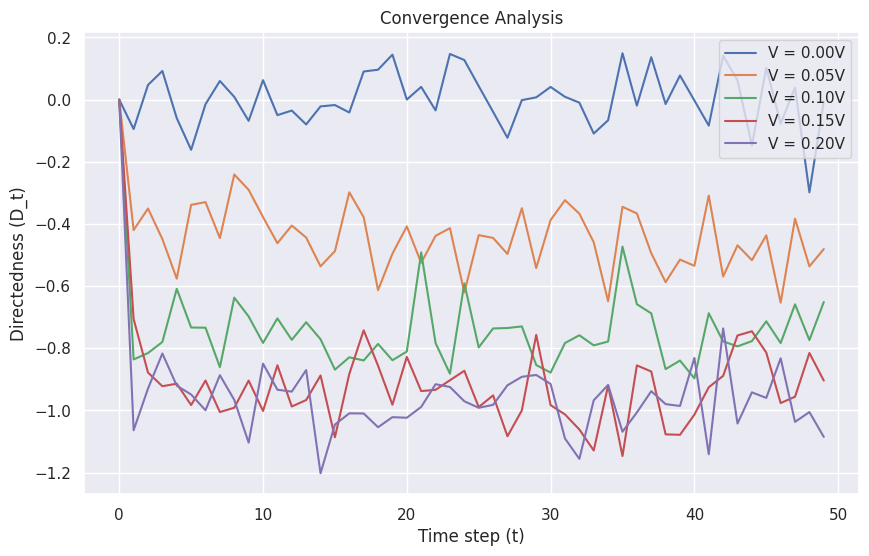


Performing Sensitivity Analysis...


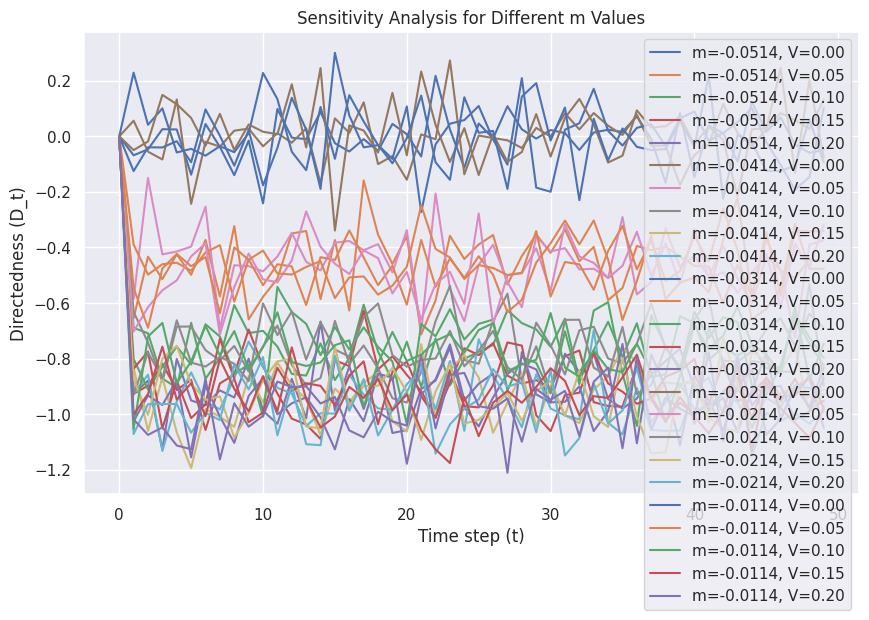


Running Monte Carlo Simulation for V=0.30V...


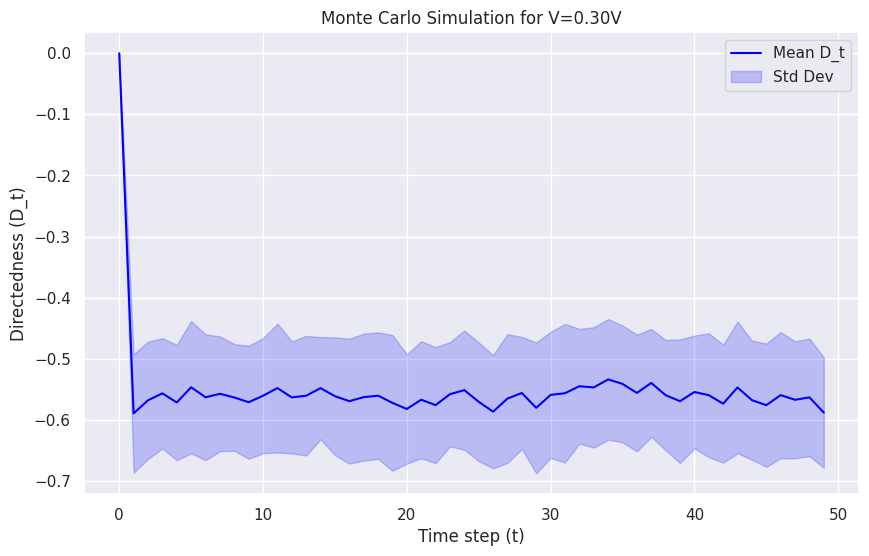

In [54]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Set seaborn style for better visualization
sns.set(style="darkgrid")

# Parameters
sigma = 0.1  # Standard deviation of Gaussian noise
timesteps = 50  # Number of timesteps
V_values = np.linspace(0, 0.2, 5)  # Voltages from 0 to 0.2V
m = -0.0314  # Average slope from regression
D_0 = 0  # Initial directedness

# Quadratic function for b(V)
def b_V(V):
    return 29.81 * V**2 - 10.89 * V + 0.0029

# Simulation function
def simulate_Dt(V, m_value=m):
    bV = b_V(V)
    D_t = np.zeros(timesteps)

    for t in range(1, timesteps):
        sum_noise = sum(m_value**k * np.random.normal(0, sigma) for k in range(t))
        D_t[t] = (D_0 - bV / (1 - m_value)) * m_value**t + bV / (1 - m_value) + sum_noise

    return D_t

# Convergence and Stability Check
def check_convergence():
    print("\nChecking Convergence and Stability...")
    plt.figure(figsize=(10, 6))
    for V in V_values:
        D_t_values = simulate_Dt(V)
        diffs = np.abs(np.diff(D_t_values[-10:]))  # Check last 10 timesteps
        if np.all(diffs < 0.01):
            print(f"D_t appears to be converging for V={V:.2f}V")
        else:
            print(f"Warning: D_t may not be stable for V={V:.2f}V")
        plt.plot(range(timesteps), D_t_values, label=f'V = {V:.2f}V')
    plt.xlabel('Time step (t)')
    plt.ylabel('Directedness (D_t)')
    plt.title('Convergence Analysis')
    plt.legend()
    plt.show()

# Parameter Sensitivity Analysis
def sensitivity_analysis():
    print("\nPerforming Sensitivity Analysis...")
    m_values = np.linspace(m - 0.02, m + 0.02, 5)  # Varying m by ±0.02
    plt.figure(figsize=(10, 6))
    for new_m in m_values:
        for V in V_values:
            D_t_values = simulate_Dt(V, new_m)
            plt.plot(range(timesteps), D_t_values, label=f'm={new_m:.4f}, V={V:.2f}')
    plt.xlabel('Time step (t)')
    plt.ylabel('Directedness (D_t)')
    plt.title('Sensitivity Analysis for Different m Values')
    plt.legend()
    plt.show()

# Monte Carlo Simulation
def monte_carlo_simulation(V, num_simulations=100):
    print(f"\nRunning Monte Carlo Simulation for V={V:.2f}V...")
    all_trajectories = np.zeros((num_simulations, timesteps))
    for i in range(num_simulations):
        all_trajectories[i] = simulate_Dt(V)

    mean_Dt = np.mean(all_trajectories, axis=0)
    std_Dt = np.std(all_trajectories, axis=0)

    plt.figure(figsize=(10, 6))
    plt.plot(range(timesteps), mean_Dt, label='Mean D_t', color='blue')
    plt.fill_between(range(timesteps), mean_Dt - std_Dt, mean_Dt + std_Dt, color='blue', alpha=0.2, label='Std Dev')
    plt.xlabel('Time step (t)')
    plt.ylabel('Directedness (D_t)')
    plt.title(f'Monte Carlo Simulation for V={V:.2f}V')
    plt.legend()
    plt.show()

# Run analyses
check_convergence()
sensitivity_analysis()
monte_carlo_simulation(0.3)  # Example Monte Carlo run for V = 0.1V



Performing Sensitivity Analysis...


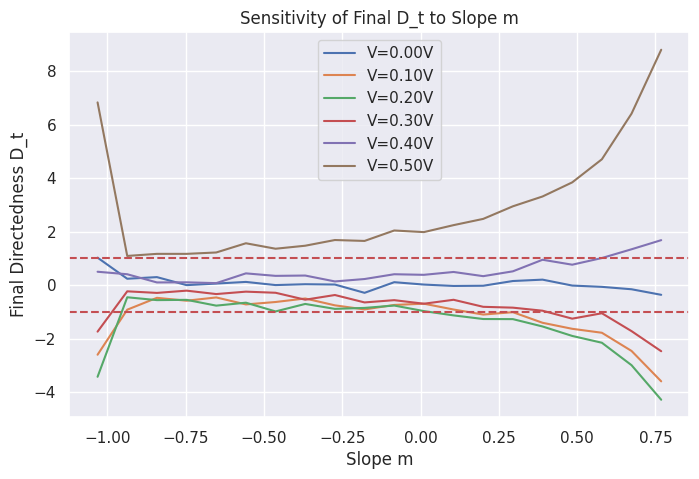

In [55]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Set seaborn style for better visualization
sns.set(style="darkgrid")

# Parameters
sigma = 0.1  # Standard deviation of Gaussian noise
timesteps = 50  # Number of timesteps
V_values = np.linspace(0, .5, 6)  # Voltages from 0 to 0.2V
m = -0.0314  # Average slope from regression
D_0 = 0  # Initial directedness

# Quadratic function for b(V)
def b_V(V):
    return 29.81 * V**2 - 10.89 * V + 0.0029

# Simulation function
def simulate_Dt(V, m_value=m):
    bV = b_V(V)
    D_t = np.zeros(timesteps)

    for t in range(1, timesteps):
        sum_noise = np.sum([m_value**k * np.random.normal(0, sigma) for k in range(t)])
        D_t[t] = (D_0 - bV / (1 - m_value)) * m_value**t + bV / (1 - m_value) + sum_noise

    return D_t


# Parameter Sensitivity Analysis
def sensitivity_analysis():
    print("\nPerforming Sensitivity Analysis...")
    m_values = np.linspace(m - 1, m + .8, 20)  # Varying m by ±0.02
    sensitivity_results = {}
    # plt.figure(figsize=(10, 6))
    for new_m in m_values:
        avg_final_values = []
        for V in V_values:
            D_t_values = simulate_Dt(V, new_m)
            avg_final_values.append(D_t_values[-1])
            # plt.plot(range(timesteps), D_t_values, label=f'm={new_m:.4f}, V={V:.2f}')
        sensitivity_results[new_m] = avg_final_values

    # plt.xlabel('Time step (t)')
    # plt.ylabel('Directedness (D_t)')
    # plt.title('Sensitivity Analysis for Different m Values')
    # plt.legend()
    # plt.show()

    # Plot sensitivity as a function of m
    plt.figure(figsize=(8, 5))
    for i, V in enumerate(V_values):
        plt.plot(m_values, [sensitivity_results[m_val][i] for m_val in m_values], label=f'V={V:.2f}V')
    plt.axhline(y=-1, color='r', linestyle='--')
    plt.axhline(y=1, color='r', linestyle='--')
    plt.xlabel('Slope m')
    plt.ylabel('Final Directedness D_t')
    plt.title('Sensitivity of Final D_t to Slope m')
    plt.legend()
    plt.show()

# Monte Carlo Simulation
# def monte_carlo_simulation(V, num_simulations=100):
#     print(f"\nRunning Monte Carlo Simulation for V={V:.2f}V...")
#     all_trajectories = np.zeros((num_simulations, timesteps))
#     for i in range(num_simulations):
#         all_trajectories[i] = simulate_Dt(V)

#     mean_Dt = np.mean(all_trajectories, axis=0)
#     std_Dt = np.std(all_trajectories, axis=0)

#     plt.figure(figsize=(10, 6))
#     plt.plot(range(timesteps), mean_Dt, label='Mean D_t', color='blue')
#     plt.fill_between(range(timesteps), mean_Dt - std_Dt, mean_Dt + std_Dt, color='blue', alpha=0.2, label='Std Dev')
#     plt.xlabel('Time step (t)')
#     plt.ylabel('Directedness (D_t)')
#     plt.title(f'Monte Carlo Simulation for V={V:.2f}V')
#     plt.legend()
#     plt.show()

# Run analyses
# check_convergence()
sensitivity_analysis()
# monte_carlo_simulation(0.1)  # Example Monte Carlo run for V = 0.1V



Performing Sensitivity Analysis for b(V)...


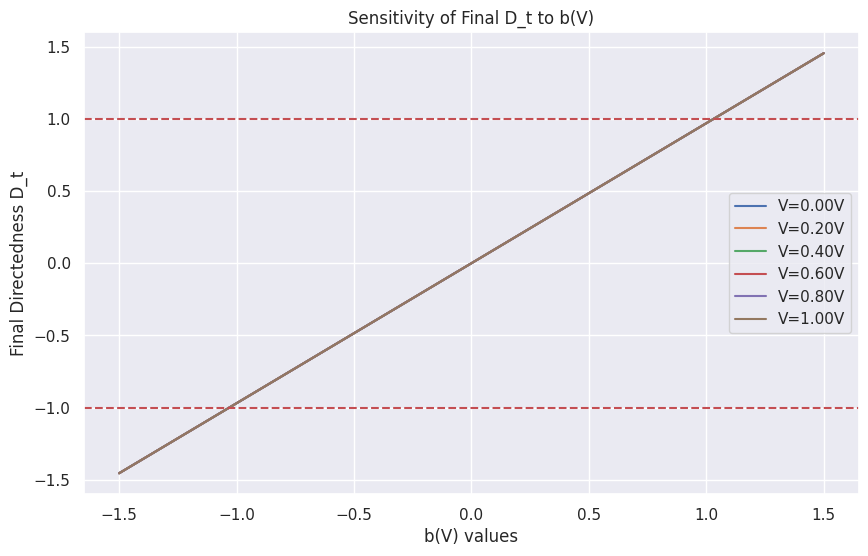

In [56]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Set seaborn style for better visualization
sns.set(style="darkgrid")

# Parameters
sigma = 0.1  # Standard deviation of Gaussian noise
timesteps = 50  # Number of timesteps
V_values = np.linspace(0, 1, 6)  # Voltages from 0 to 0.2V
m = -0.0314  # Average slope from regression
D_0 = 0  # Initial directedness

# Quadratic function for b(V)
def b_V(V):
    return 29.81 * V**2 - 10.89 * V + 0.0029

# Simulation function
def simulate_Dt(V, m_value=m, b_value=None):
    if b_value is None:
        b_value = b_V(V)
    D_t = np.zeros(timesteps)

    for t in range(1, timesteps):
        sum_noise = np.sum([m_value**k * np.random.normal(0, sigma) for k in range(t)])
        D_t[t] = (D_0 - b_value / (1 - m_value)) * m_value**t + b_value / (1 - m_value)# + sum_noise

    return D_t

# # Parameter Sensitivity Analysis
# def sensitivity_analysis():
#     print("\nPerforming Sensitivity Analysis...")
#     m_values = np.linspace(m - 0.02, m + 0.02, 5)  # Varying m by ±0.02
#     b_values = np.linspace(-5, 5, 5)  # Varying b(V) within a reasonable range

#     # plt.figure(figsize=(10, 6))
#     for new_m in m_values:
#         for V in V_values:
#             D_t_values = simulate_Dt(V, m_value=new_m)

#     plt.figure(figsize=(10, 6))
#     for new_b in b_values:
#         for V in V_values:
#             D_t_values = simulate_Dt(V, b_value=new_b)
#             plt.plot(range(timesteps), D_t_values, label=f'b(V)={new_b:.2f}, V={V:.2f}')
#     plt.xlabel('Time step (t)')
#     plt.ylabel('Directedness (D_t)')
#     plt.title('Sensitivity Analysis for Different b(V) Values')
#     plt.legend()
#     plt.show()

# Parameter Sensitivity Analysis
# Sensitivity Analysis for b(V)
def sensitivity_analysis_b():
    print("\nPerforming Sensitivity Analysis for b(V)...")
    b_values = np.linspace(-1.5, 1.5, 10)  # Varying b(V) within a reasonable range
    final_values = {V: [] for V in V_values}

    plt.figure(figsize=(10, 6))
    for new_b in b_values:
        for V in V_values:
            D_t_values = simulate_Dt(V, b_value=new_b)
            final_values[V].append(D_t_values[-1])

    for V in V_values:
        plt.plot(b_values, final_values[V], label=f'V={V:.2f}V')
    plt.axhline(y=-1, color='r', linestyle='--')
    plt.axhline(y=1, color='r', linestyle='--')
    plt.xlabel('b(V) values')
    plt.ylabel('Final Directedness D_t')
    plt.title('Sensitivity of Final D_t to b(V)')
    plt.legend()
    plt.show()


# Run analyses
# check_convergence()
sensitivity_analysis_b()
# monte_carlo_simulation(0.1)  # Example Monte Carlo run for V = 0.1V



Performing 3D Sensitivity Analysis for m and b(V)...


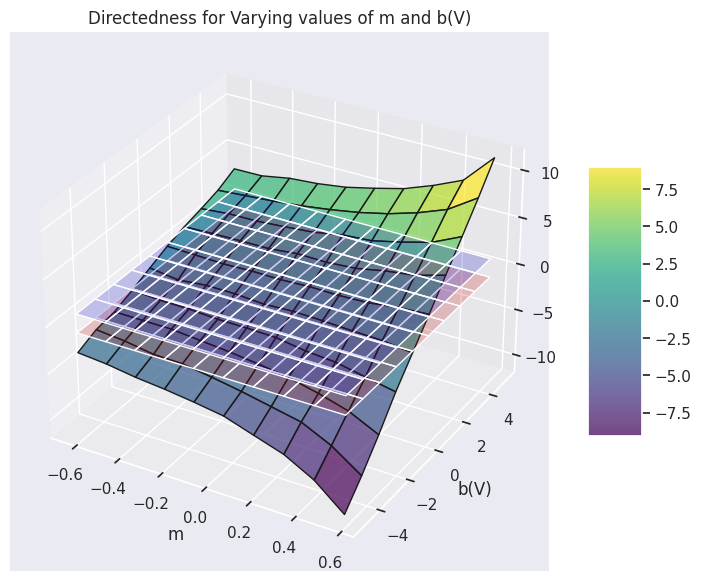

In [61]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D

# Set seaborn style for better visualization
sns.set(style="darkgrid")

# Parameters
sigma = 0.1  # Standard deviation of Gaussian noise
timesteps = 50  # Number of timesteps
V_values = np.linspace(0, 0.2, 5)  # Voltages from 0 to 0.2V
m = -0.0314  # Average slope from regression
D_0 = 0  # Initial directedness

# Quadratic function for b(V)
def b_V(V):
    return 29.81 * V**2 - 10.89 * V + 0.0029

# Simulation function
def simulate_Dt(V, m_value=m, b_value=None):
    bV = b_V(V) if b_value is None else b_value
    D_t = np.zeros(timesteps)

    for t in range(1, timesteps):
        sum_noise = np.sum([m_value**k * np.random.normal(0, sigma) for k in range(t)])
        D_t[t] = (D_0 - bV / (1 - m_value)) * m_value**t + bV / (1 - m_value) + sum_noise

    return D_t[-1]  # Return final directedness

# 3D Sensitivity Analysis for m and b(V)
def sensitivity_analysis_3d():
    print("\nPerforming 3D Sensitivity Analysis for m and b(V)...")
    m_values = np.linspace(m - .6, m + .6, 10)
    b_values = np.linspace(-5, 5, 10)
    M, B = np.meshgrid(m_values, b_values)
    Z = np.zeros_like(M)

    for i in range(M.shape[0]):
        for j in range(M.shape[1]):
            Z[i, j] = simulate_Dt(0.1, m_value=M[i, j], b_value=B[i, j])  # Example for V = 0.1V

    fig = plt.figure(figsize=(10, 7))
    ax = fig.add_subplot(111, projection='3d')
    surf = ax.plot_surface(M, B, Z, cmap='viridis', edgecolor='k', alpha=0.7)
    ax.set_xlabel('m')
    ax.set_ylabel('b(V)')
    # ax.set_zlabel('Final Directedness D_t')
    ax.set_title('Directedness for Varying values of m and b(V)')
    fig.colorbar(surf, shrink=0.5, aspect=5)

    # Add planes at z = -1 and z = 1
    ax.plot_surface(M, B, np.full_like(Z, -1), color='red', alpha=0.2)
    ax.plot_surface(M, B, np.full_like(Z, 1), color='blue', alpha=0.2)

    plt.show()

sensitivity_analysis_3d()



Performing 3D Sensitivity Analysis for m and b(V)...


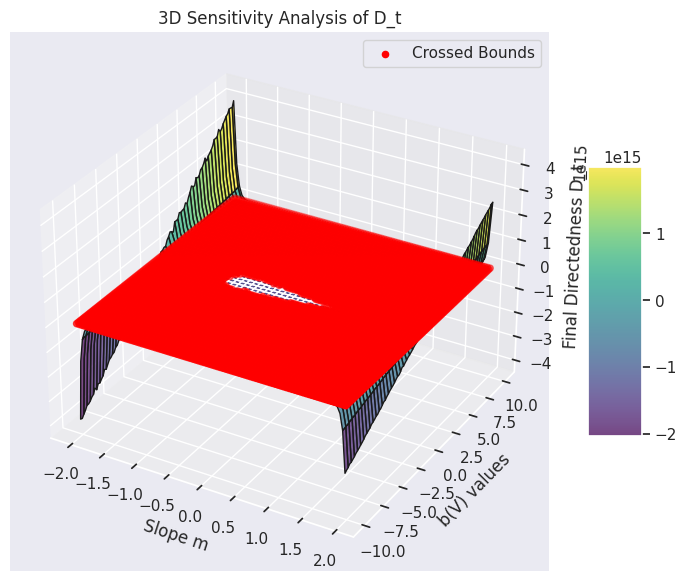

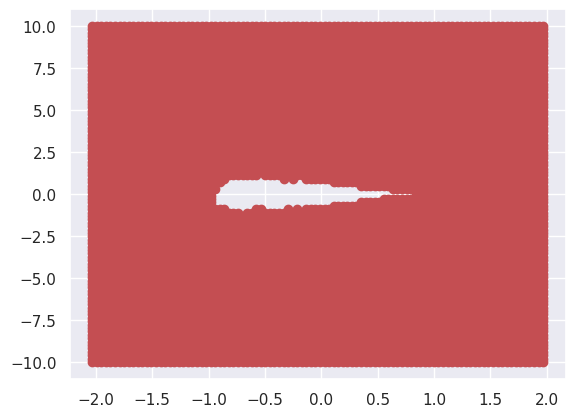

In [59]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D

# Set seaborn style for better visualization
sns.set(style="darkgrid")

# Parameters
sigma = 0.1  # Standard deviation of Gaussian noise
timesteps = 50  # Number of timesteps
V_values = np.linspace(0, 0.2, 5)  # Voltages from 0 to 0.2V
m = -0.0314  # Average slope from regression
D_0 = 0  # Initial directedness

# Quadratic function for b(V)
def b_V(V):
    return 29.81 * V**2 - 10.89 * V + 0.0029

# Simulation function
def simulate_Dt(V, m_value=m, b_value=None):
    bV = b_V(V) if b_value is None else b_value
    D_t = np.zeros(timesteps)

    for t in range(1, timesteps):
        sum_noise = np.sum([m_value**k * np.random.normal(0, sigma) for k in range(t)])
        D_t[t] = (D_0 - bV / (1 - m_value)) * m_value**t + bV / (1 - m_value) + sum_noise

    return D_t

# Function to check if directedness crosses boundaries
def check_crossing(D_t_values):
    upper_cross = np.any(D_t_values > 1)
    lower_cross = np.any(D_t_values < -1)
    return upper_cross, lower_cross

# 3D Sensitivity Analysis for m and b(V) with crossing checks
def sensitivity_analysis_3d():
    print("\nPerforming 3D Sensitivity Analysis for m and b(V)...")
    m_values = np.linspace(m - 2, m + 2, 100)
    b_values = np.linspace(-10, 10, 100)
    M, B = np.meshgrid(m_values, b_values)
    Z = np.zeros_like(M)
    crossing_m = []
    crossing_b = []

    for i in range(M.shape[0]):
        for j in range(M.shape[1]):
            D_t_values = simulate_Dt(0.1, m_value=M[i, j], b_value=B[i, j])  # Example for V = 0.1V
            Z[i, j] = D_t_values[-1]  # Final directedness
            upper_cross, lower_cross = check_crossing(D_t_values)
            if upper_cross or lower_cross:
                crossing_m.append(M[i, j])
                crossing_b.append(B[i, j])

    fig = plt.figure(figsize=(10, 7))
    ax = fig.add_subplot(111, projection='3d')
    surf = ax.plot_surface(M, B, Z, cmap='viridis', edgecolor='k', alpha=0.7)
    ax.set_xlabel('Slope m')
    ax.set_ylabel('b(V) values')
    ax.set_zlabel('Final Directedness D_t')
    ax.set_title('3D Sensitivity Analysis of D_t')
    fig.colorbar(surf, shrink=0.5, aspect=5)

    # Add planes at z = -1 and z = 1
    ax.plot_surface(M, B, np.full_like(Z, -1), color='red', alpha=0.3)
    ax.plot_surface(M, B, np.full_like(Z, 1), color='blue', alpha=0.3)

    # Plot points where crossing occurs
    if crossing_m:
        ax.scatter(crossing_m, crossing_b, np.ones_like(crossing_m), color='red', label='Crossed Bounds')

    plt.legend()
    plt.show()

    # print("Values of m and b(V) where D_t crossed -1 or 1:")
    # for i in range(len(crossing_m)):
        # print(f"m = {crossing_m[i]:.4f}, b(V) = {crossing_b[i]:.4f}")

    return crossing_m, crossing_b
# Run analyses
crossing_m, crossing_b = sensitivity_analysis_3d()

plt.plot(crossing_m, crossing_b, 'ro', label='Crossed Bounds')


Performing 3D Sensitivity Analysis for m and b(V)...


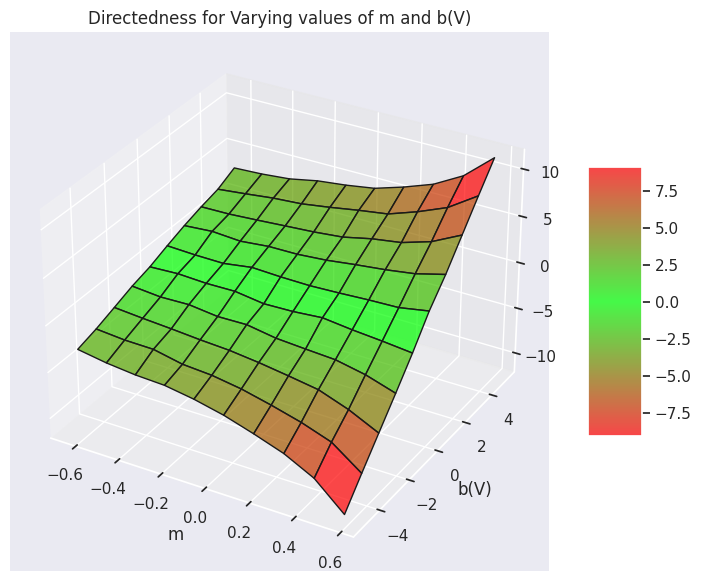

In [62]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.colors as mcolors

# Custom color map to make values between -1 and 1 green, and outside red
def custom_cmap():
    colors = [
        (1, 0, 0),  # Red
        (0, 1, 0),  # Green
        (1, 0, 0)   # Red
    ]
    nodes = [0, 0.5, 1]  # Values at which to switch colors
    return mcolors.LinearSegmentedColormap.from_list("red_green", list(zip(nodes, colors)))

# Sensitivity Analysis for m and b(V) with custom color map
def sensitivity_analysis_3d():
    print("\nPerforming 3D Sensitivity Analysis for m and b(V)...")
    m_values = np.linspace(m - .6, m + .6, 10)
    b_values = np.linspace(-5, 5, 10)
    M, B = np.meshgrid(m_values, b_values)
    Z = np.zeros_like(M)

    for i in range(M.shape[0]):
        for j in range(M.shape[1]):
            Z[i, j] = simulate_Dt(0.1, m_value=M[i, j], b_value=B[i, j])  # Example for V = 0.1V

    # Create the custom colormap
    cmap = custom_cmap()

    # Create the 3D plot
    fig = plt.figure(figsize=(10, 7))
    ax = fig.add_subplot(111, projection='3d')
    surf = ax.plot_surface(M, B, Z, cmap=cmap, edgecolor='k', alpha=0.7)
    ax.set_xlabel('m')
    ax.set_ylabel('b(V)')
    ax.set_title('Directedness for Varying values of m and b(V)')

    # Add colorbar with custom colormap
    fig.colorbar(surf, shrink=0.5, aspect=5)

    # # Add planes at z = -1 and z = 1
    # ax.plot_surface(M, B, np.full_like(Z, -1), color='red', alpha=0.2)
    # ax.plot_surface(M, B, np.full_like(Z, 1), color='blue', alpha=0.2)

    plt.show()

# Run the 3D Sensitivity Analysis
sensitivity_analysis_3d()


In [64]:
# import numpy as np
# import matplotlib.pyplot as plt
# from mpl_toolkits.mplot3d import Axes3D
# import matplotlib.colors as mcolors

# # Custom color map to make values between -1 and 1 yellow, < -1 red, > 1 green
# def custom_cmap():
#     # Red for < -1, Yellow for -1 to 1, Green for > 1
#     colors = [
#         (1, 0, 0),  # Red for values < -1
#         (1, 1, 0),  # Yellow for values between -1 and 1
#         (0, 1, 0)   # Green for values > 1
#     ]
#     nodes = [0, 0.5, 1]  # Values at which to switch colors
#     return mcolors.LinearSegmentedColormap.from_list("red_yellow_green", list(zip(nodes, colors)), N=3)

# # Sensitivity Analysis for m and b(V) with custom color map
# def sensitivity_analysis_3d():
#     print("\nPerforming 3D Sensitivity Analysis for m and b(V)...")
#     m_values = np.linspace(m - .6, m + .6, 10)
#     b_values = np.linspace(-5, 5, 10)
#     # m_values = np.linspace(m - 1, m + .8, 20)
#     # b_values = np.linspace(-5, 5, 20)
#     M, B = np.meshgrid(m_values, b_values)
#     Z = np.zeros_like(M)

#     for i in range(M.shape[0]):
#         for j in range(M.shape[1]):
#             Z[i, j] = simulate_Dt(0.1, m_value=M[i, j], b_value=B[i, j])  # Example for V = 0.1V

#     # Create the custom colormap
#     cmap = custom_cmap()

#     # Create the 3D plot
#     fig = plt.figure(figsize=(10, 7))
#     ax = fig.add_subplot(111, projection='3d')
#     surf = ax.plot_surface(M, B, Z, cmap=cmap, edgecolor='k', alpha=0.7)
#     ax.set_xlabel('m')
#     ax.set_ylabel('b(V)')
#     ax.set_title('Directedness for Varying values of m and b(V)')

#     # Add colorbar with custom colormap
#     fig.colorbar(surf, shrink=0.5, aspect=5)

#     # Add planes at z = -1 and z = 1
#     # ax.plot_surface(M, B, np.full_like(Z, -1), color='red', alpha=0.2)
#     # ax.plot_surface(M, B, np.full_like(Z, 1), color='blue', alpha=0.2)

#     plt.show()

# # Run the 3D Sensitivity Analysis
# sensitivity_analysis_3d()



Performing 3D Sensitivity Analysis for m and b(V)...


<ipython-input-61-85df61babbfe>:27: RuntimeWarning: divide by zero encountered in scalar divide
  D_t[t] = (D_0 - bV / (1 - m_value)) * m_value**t + bV / (1 - m_value) + sum_noise
<ipython-input-61-85df61babbfe>:27: RuntimeWarning: invalid value encountered in scalar add
  D_t[t] = (D_0 - bV / (1 - m_value)) * m_value**t + bV / (1 - m_value) + sum_noise


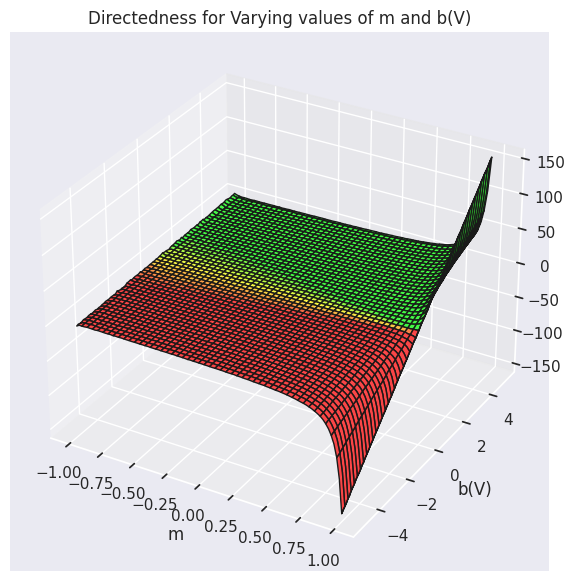

In [65]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.colors as mcolors

# Custom color map to make values between -1 and 1 yellow, < -1 red, > 1 green
def custom_cmap():
    # Red for < -1, Yellow for -1 to 1, Green for > 1
    colors = [
        (1, 0, 0),  # Red for values < -1
        (1, 1, 0),  # Yellow for values between -1 and 1
        (0, 1, 0)   # Green for values > 1
    ]
    nodes = [0, 0.5, 1]  # Values at which to switch colors
    return mcolors.LinearSegmentedColormap.from_list("red_yellow_green", list(zip(nodes, colors)), N=256)

# Sensitivity Analysis for m and b(V) with custom color map
def sensitivity_analysis_3d():
    print("\nPerforming 3D Sensitivity Analysis for m and b(V)...")
    m_values = np.linspace(- 1, 1, 100)
    b_values = np.linspace(-5, 5, 100)
    M, B = np.meshgrid(m_values, b_values)
    Z = np.zeros_like(M)

    for i in range(M.shape[0]):
        for j in range(M.shape[1]):
            Z[i, j] = simulate_Dt(0.1, m_value=M[i, j], b_value=B[i, j])  # Example for V = 0.1V

    # Create the custom colormap
    cmap = custom_cmap()

    # Normalize Z values to map the range [-1, 1] to the colormap
    norm = mcolors.TwoSlopeNorm(vmin=-1, vcenter=0, vmax=1)

    # Create the 3D plot
    fig = plt.figure(figsize=(10, 7))
    ax = fig.add_subplot(111, projection='3d')
    surf = ax.plot_surface(M, B, Z, cmap=cmap, edgecolor='k', alpha=0.7, norm=norm)
    ax.set_xlabel('m')
    ax.set_ylabel('b(V)')
    ax.set_title('Directedness for Varying values of m and b(V)')

    # Add colorbar with custom colormap
    # cbar = fig.colorbar(surf, shrink=0.5, aspect=5, label='Directedness (D_t)')

    # Set custom labels for each tick
    # cbar.set_ticklabels(["Very Low (< -2)", "Low (-1 to -2)", "Neutral [-1, 1]", "High (1 to 2)", "Very High (> 2)"])
    # Add planes at z = -1 and z = 1 for better visualization
    # ax.plot_surface(M, B, np.full_like(Z, -1), color='red', alpha=0.2)
    # ax.plot_surface(M, B, np.full_like(Z, 1), color='blue', alpha=0.2)
    # cbar.set_ticklabels(["≤-1.00", "-0.75", "-0.50", "-0.25", "0.00", "0.25", "0.50", "0.75", "≥1.00"])  # Custom labels

    plt.show()

# Run the 3D Sensitivity Analysis
sensitivity_analysis_3d()



Performing 2D Sensitivity Analysis for m and b(V)...


<ipython-input-61-85df61babbfe>:27: RuntimeWarning: divide by zero encountered in scalar divide
  D_t[t] = (D_0 - bV / (1 - m_value)) * m_value**t + bV / (1 - m_value) + sum_noise
<ipython-input-61-85df61babbfe>:27: RuntimeWarning: invalid value encountered in scalar add
  D_t[t] = (D_0 - bV / (1 - m_value)) * m_value**t + bV / (1 - m_value) + sum_noise
<ipython-input-66-80dac1b1a71c>:44: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cbar.set_ticklabels(["≤-1.00", "-0.75", "-0.50", "-0.25", "0.00", "0.25", "0.50", "0.75", "≥1.00"])  # Custom labels


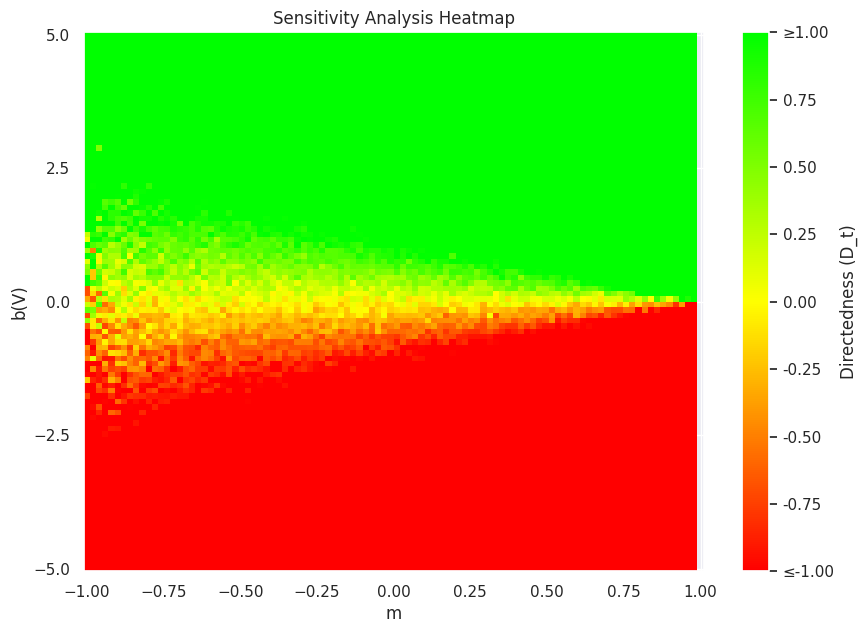

In [66]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# Custom color map to make values between -1 and 1 yellow, < -1 red, > 1 green
def custom_cmap():
    colors = [
        (1, 0, 0),  # Red for values < -1
        (1, 1, 0),  # Yellow for values between -1 and 1
        (0, 1, 0)   # Green for values > 1
    ]
    nodes = [0, 0.5, 1]
    return mcolors.LinearSegmentedColormap.from_list("red_yellow_darkgreen", list(zip(nodes, colors)), N=256)

# Sensitivity Analysis Heatmap for m and b(V)
def sensitivity_analysis_2d():
    print("\nPerforming 2D Sensitivity Analysis for m and b(V)...")
    m_values = np.linspace(- 1, 1, 100)
    b_values = np.linspace(-5, 5, 100)
    M, B = np.meshgrid(m_values, b_values)
    Z = np.zeros_like(M)

    for i in range(M.shape[0]):
        for j in range(M.shape[1]):
            Z[i, j] = simulate_Dt(0.1, m_value=M[i, j], b_value=B[i, j])

    # Create the custom colormap
    cmap = custom_cmap()

    # Normalize Z values so transitions occur exactly at -1 and 1
    norm = mcolors.TwoSlopeNorm(vmin=-1, vcenter=0, vmax=1)

    # Create the 2D heatmap
    plt.figure(figsize=(10, 7))
    plt.pcolormesh(M, B, Z, cmap=cmap, norm=norm, shading='auto')

    # Labels and title
    plt.xlabel('m')
    plt.ylabel('b(V)')
    plt.title('Sensitivity Analysis Heatmap')
    plt.yticks([-5, -2.5, 0, 2.5, 5])
    # Add colorbar
    cbar = plt.colorbar(label='Directedness (D_t)')
    cbar.set_ticklabels(["≤-1.00", "-0.75", "-0.50", "-0.25", "0.00", "0.25", "0.50", "0.75", "≥1.00"])  # Custom labels


    plt.show()

# Run the 2D Sensitivity Analysis
sensitivity_analysis_2d()


RMSE values: {'Linear': 0.12956011340444096, 'Quadratic': 0.05858695817152055, 'Cubic': 0.05857398481988016, 'Quartic': 0.05408083893242201, 'Exponential': 0.1832773528565926, 'Logistic': 0.07936854344693854, 'Sigmoid': 0.07936854344693854}
Best-fitting equation: Quartic


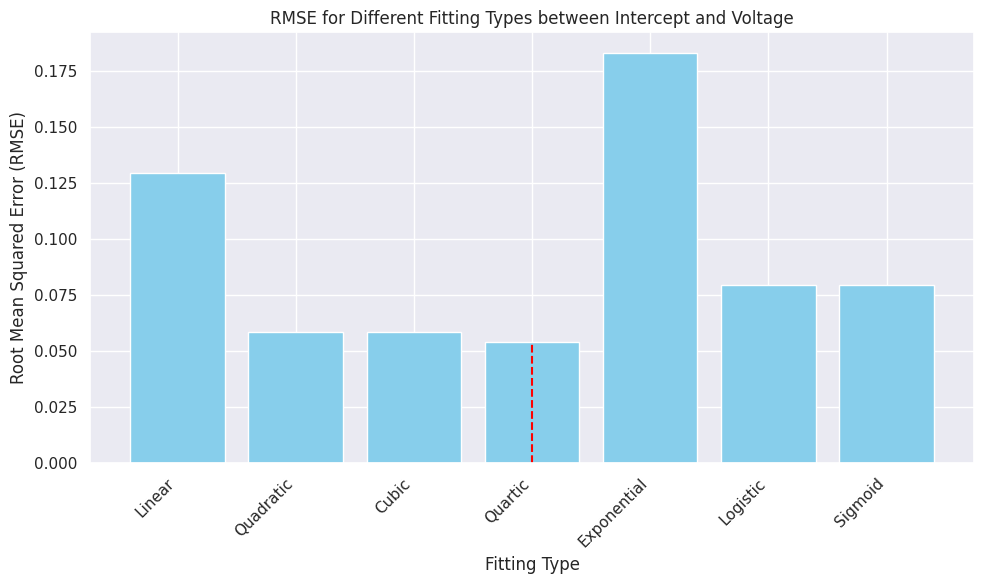

In [91]:
import numpy as np
from scipy.optimize import curve_fit

# Given data points
V_values = np.array([0.000, 0.015, 0.030, 0.050, 0.075, 0.100, 0.200])
b_values = np.array([-0.01, -0.09, -0.36, -0.51, -0.54, -0.84, -0.98])

# Define fitting functions
def linear(V, c, d):
    return c * V + d

def quadratic(V, a, c, d):
    return a * V**2 + c * V + d

def cubic(V, a, b, c, d):
    return a * V**3 + b * V**2 + c * V + d

def quartic(V, a, b, c, d, e):
    return a * V**4 + b * V**3 + c * V**2 + d * V + e

def exponential(V, a, b):
    return a * np.exp(b * V)

def exponential(V, a, b):
    return a * np.exp(b * V)

def logistic(V, a, b, c):
    return a / (1 + np.exp(-b * (V - c)))

def sigmoid(V, a, b, c):
    return a / (1 + np.exp(-b * (V - c)))


# Fit data to models
popt_linear, _ = curve_fit(linear, V_values, b_values)
popt_quadratic, _ = curve_fit(quadratic, V_values, b_values)
popt_cubic, _ = curve_fit(cubic, V_values, b_values)
popt_quartic, _ = curve_fit(quartic, V_values, b_values)
popt_exponential, _ = curve_fit(exponential, V_values, b_values)
popt_logistic, _ = curve_fit(logistic, V_values, b_values)
popt_sigmoid, _ = curve_fit(sigmoid, V_values, b_values)


# Compute predictions
b_pred_linear = linear(V_values, *popt_linear)
b_pred_quadratic = quadratic(V_values, *popt_quadratic)
b_pred_cubic = cubic(V_values, *popt_cubic)
b_pred_quartic = quartic(V_values, *popt_quartic)
b_pred_exponential = exponential(V_values, *popt_exponential)
b_pred_logistic = logistic(V_values, *popt_logistic)
b_pred_sigmoid = sigmoid(V_values, *popt_sigmoid)


# Compute RMSE for each model
rmse_linear = np.sqrt(np.mean((b_values - b_pred_linear) ** 2))
rmse_quadratic = np.sqrt(np.mean((b_values - b_pred_quadratic) ** 2))
rmse_cubic = np.sqrt(np.mean((b_values - b_pred_cubic) ** 2))
rmse_quartic = np.sqrt(np.mean((b_values - b_pred_quartic) ** 2))
rmse_exponential = np.sqrt(np.mean((b_values - b_pred_exponential) ** 2))
rmse_logistic = np.sqrt(np.mean((b_values - b_pred_logistic) ** 2))
rmse_sigmoid = np.sqrt(np.mean((b_values - b_pred_sigmoid) ** 2))


# Determine the best fit
rmse_results = {
    "Linear": rmse_linear,
    "Quadratic": rmse_quadratic,
    "Cubic": rmse_cubic,
    "Quartic": rmse_quartic,
    "Exponential": rmse_exponential,
    "Logistic": rmse_logistic,
    "Sigmoid": rmse_sigmoid
}

best_fit = min(rmse_results, key=rmse_results.get)

print("RMSE values:", rmse_results)
print("Best-fitting equation:", best_fit)


# Prepare data for plotting
labels = list(rmse_results.keys())
rmse_values = list(rmse_results.values())

# Plotting the bar chart
plt.figure(figsize=(10, 6))
plt.bar(labels, rmse_values, color='skyblue')
plt.xlabel('Fitting Type')
plt.ylabel('Root Mean Squared Error (RMSE)')
plt.title('RMSE for Different Fitting Types between Intercept and Voltage')
plt.vlines(best_fit, 0, rmse_results[best_fit], colors='red', linestyles='dashed')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

## AIC Score for fitting

AIC Scores for different models:
Quadratic: -33.83
Cubic: -31.83
Quartic: -30.93
Logistic: -29.37
Linear: -24.46
Exponential: -22.46


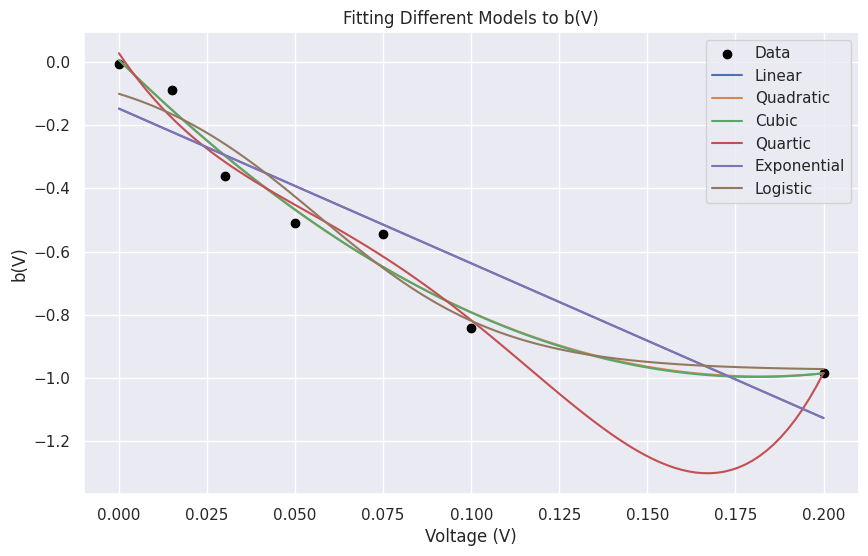

In [88]:
# Set seaborn style for better visualization
sns.set(style="darkgrid")

# Parameters
sigma = 0.1  # Standard deviation of Gaussian noise
timesteps = 50  # Number of timesteps
V_values = np.linspace(0, 0.2, 5)  # Voltages from 0 to 0.2V
m = -0.0314  # Average slope from regression
D_0 = 0  # Initial directedness

# Quadratic function for b(V)
def b_V(V):
    return 29.81 * V**2 - 10.89 * V + 0.0029

# Simulation function
def simulate_Dt(V, m_value=m, b_value=None):
    bV = b_V(V) if b_value is None else b_value
    D_t = np.zeros(timesteps)

    for t in range(1, timesteps):
        sum_noise = np.sum([m_value**k * np.random.normal(0, sigma) for k in range(t)])
        D_t[t] = (D_0 - bV / (1 - m_value)) * m_value**t + bV / (1 - m_value) + sum_noise

    return D_t

# Function to compute AIC
def compute_aic(y_true, y_pred, num_params):
    residuals = y_true - y_pred
    sse = np.sum(residuals**2)
    n = len(y_true)
    aic = n * np.log(sse / n) + 2 * num_params
    return aic

# Models for b(V)
def linear(V, a, c):
    return a * V + c

def quadratic(V, a, b, c):
    return a * V**2 + b * V + c

def cubic(V, a, b, c, d):
    return a * V**3 + b * V**2 + c * V + d

def quartic(V, a, b, c, d, e):
    return a * V**4 + b * V**3 + c * V**2 + d * V + e

def exponential(V, a, b, c):
    return a * np.exp(b * V) + c

def logistic(V, a, b, c):
    return a / (1 + np.exp(-b * (V - c)))

# Generate synthetic b(V) data
# V_sample = np.linspace(0, 0.2, 10)
# b_sample = b_V(V_sample) + np.random.normal(0, 0.5, size=len(V_sample))  # Adding noise
V_sample = voltage_values
b_sample = intercepts


# Fit models and compute AIC
models = {
    "Linear": (linear, 2),
    "Quadratic": (quadratic, 3),
    "Cubic": (cubic, 4),
    "Quartic": (quartic, 5),
    "Exponential": (exponential, 3),
    "Logistic": (logistic, 3)
}

aic_scores = {}

for name, (model, num_params) in models.items():
    try:
        popt, _ = opt.curve_fit(model, V_sample, b_sample, maxfev=5000)
        y_pred = model(V_sample, *popt)
        aic_scores[name] = compute_aic(b_sample, y_pred, num_params)
    except RuntimeError:
        aic_scores[name] = np.inf  # If fitting fails, assign high AIC

# Print AIC results
print("AIC Scores for different models:")
for model, aic in sorted(aic_scores.items(), key=lambda x: x[1]):
    print(f"{model}: {aic:.2f}")

# Plot fitted models
plt.figure(figsize=(10, 6))
plt.scatter(V_sample, b_sample, label="Data", color='black')
V_fine = np.linspace(0, 0.2, 100)

for name, (model, _) in models.items():
    try:
        popt, _ = opt.curve_fit(model, V_sample, b_sample, maxfev=5000)
        plt.plot(V_fine, model(V_fine, *popt), label=name)
    except RuntimeError:
        pass

plt.xlabel("Voltage (V)")
plt.ylabel("b(V)")
plt.title("Fitting Different Models to b(V)")
plt.legend()
plt.show()

# LSTM model (Sargent et al, 2022)

In [85]:
df = pd.read_csv("/content/drive/MyDrive/sargent et al (2022)/cncc.csv")
df['volt'] = df['ef'] / 1000 #distance of 1e-3 m

df2 = df.loc[df['set']==2]
df = df.loc[df['set']==1]

print(df)
print(df.shape)
print(df2.shape)
df = df[['track', 'slice', 'x', 'y', 'cum_dir', 'volt']]

print(df['volt'].unique())
print(df['track'].count())

angle_radians = np.arctan2(np.diff(df['y']), np.diff(df['x']))
print(angle_radians)
df['angle'] = np.insert(angle_radians, 0, 0)
df

       Unnamed: 0  track  slice        x       y    cum_dist    euc_dist  \
0               0    1.0    1.0    0.000   0.000    0.000000    0.000000   
1               1    1.0    2.0    8.245   1.178    8.328728    8.328728   
2               2    1.0    3.0    7.067  -1.178   10.962816    7.164508   
3               3    1.0    4.0   16.490   2.356   21.026716   16.657456   
4               4    1.0    5.0   27.090   7.067   32.626437   27.996617   
...           ...    ...    ...      ...     ...         ...         ...   
12982        1845   50.0   33.0 -127.650 -21.202  171.210786  129.398792   
12983        1846   50.0   34.0 -130.742 -24.735  175.905736  133.061229   
12984        1847   50.0   35.0 -135.159 -26.502  180.663065  137.732753   
12985        1848   50.0   36.0 -135.601 -30.036  184.224598  138.887697   
12986        1849   50.0   37.0 -143.552 -34.453  193.320108  147.628540   

          speed   cum_dir   ef  set  volt  
0      0.000000  0.000000    0    1   0.0  

,track,slice,x,y,cum_dir,volt,angle
0,1.0,1.0,0.000,0.000,0.000000,0.0,0.000000
1,1.0,2.0,8.245,1.178,0.989947,0.0,0.141914
2,1.0,3.0,7.067,-1.178,0.986390,0.0,-2.034444
3,1.0,4.0,16.490,2.356,0.989947,0.0,0.358806
4,1.0,5.0,27.090,7.067,0.967617,0.0,0.418216
...,...,...,...,...,...,...,...
12982,50.0,33.0,-127.650,-21.202,-0.986485,0.2,2.158625
12983,50.0,34.0,-130.742,-24.735,-0.982570,0.2,-2.289727
12984,50.0,35.0,-135.159,-26.502,-0.981313,0.2,-2.761047
12985,50.0,36.0,-135.601,-30.036,-0.976336,0.2,-1.695221


## Data Visualization

Below we see the migrations of cells.

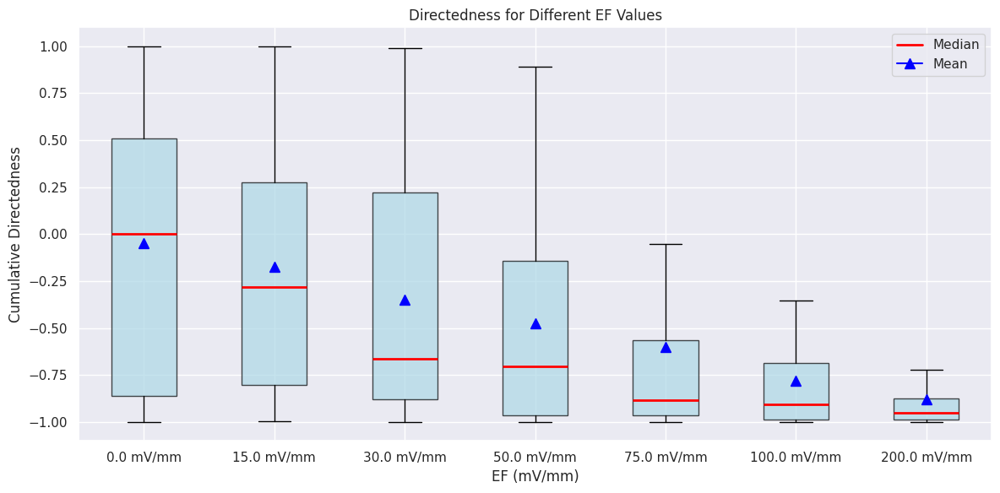

In [86]:
volts = df['volt'].unique()
all_last_dir = []  # Store last_dir for each volt
positions = []  # Store positions for the box plots on x-axis
median_values = []  # Store median values for each volt
mean_values = []  # Store mean values for each volt

fig, ax = plt.subplots(figsize=(12, 6))  # Create a single figure and axes

for i, volt in enumerate(volts):
    cells = df[df['volt'] == volt]['track'].unique()
    last_dir = []
    positions.append(i + 1)  # Assign positions for box plots

    for cell_idx in cells:
        cell_data = df[(df['track'] == cell_idx) & (df['volt'] == volt)]
        direction = cell_data['cum_dir'].values

        last_dir.append(direction[-1])

    all_last_dir.append(last_dir)  # Append last_dir for this EF

    # Calculate median and mean
    median_values.append(np.median(last_dir))
    mean_values.append(np.mean(last_dir))


# Create the box plot
boxplot_data = all_last_dir  # Data for the box plot
boxplot = ax.boxplot(boxplot_data, positions=positions, widths=0.5, patch_artist=True, showfliers=False, medianprops={'color': 'red', 'linewidth': 2})  # Basic box plot
# color = 'orange'  # Box color
for box in boxplot['boxes']:
    box.set_facecolor('lightblue')
    box.set_alpha(0.7)


plt.plot([], [], color='red', linewidth=2, label='Median')

# # Plot median and mean
for i, mean in enumerate(mean_values):
#     # ax.plot(i + 1, median, color='red', marker='_', markersize=8, label='Median' if i == 0 else "")  # Plot median as red circle
    ax.plot(i + 1, mean, color='blue', marker='^', markersize=8, label='Mean' if i == 0 else "")  # Plot mean as green 'x'


# Set x-axis labels
ax.set_xticklabels([f"{volt * 1000} mV/mm" for volt in volts])

# Set plot title and labels
ax.set_title("Directedness for Different EF Values")
ax.set_xlabel("EF (mV/mm)")
ax.set_ylabel("Cumulative Directedness")
ax.legend()  # Show legend for median and mean

# Show the plot
plt.tight_layout()
plt.show()

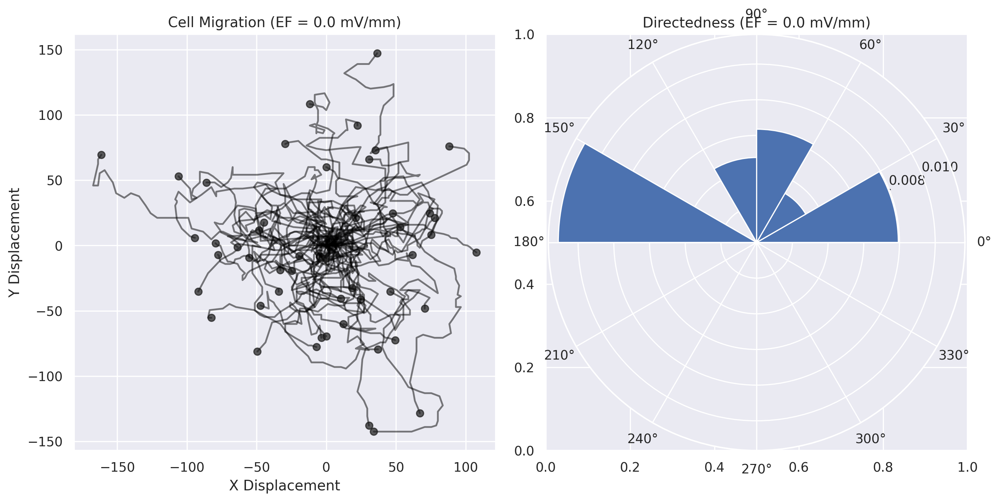

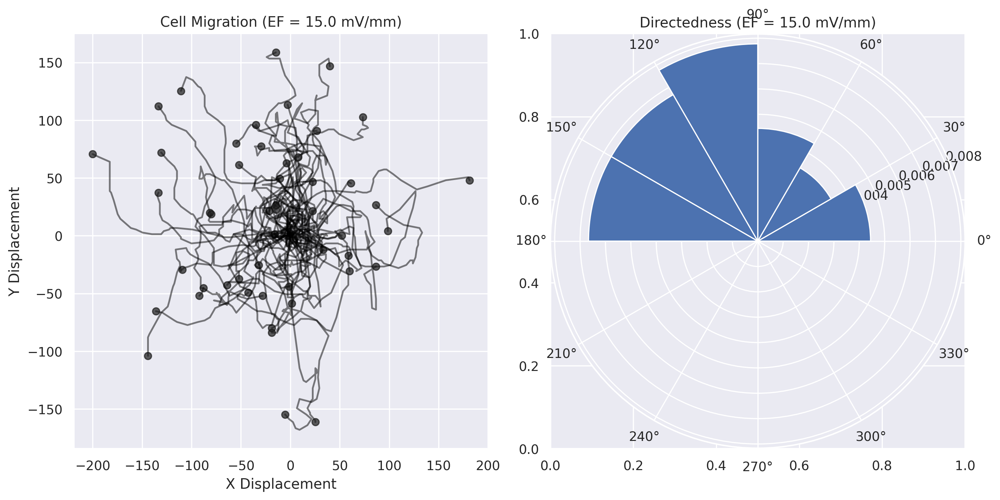

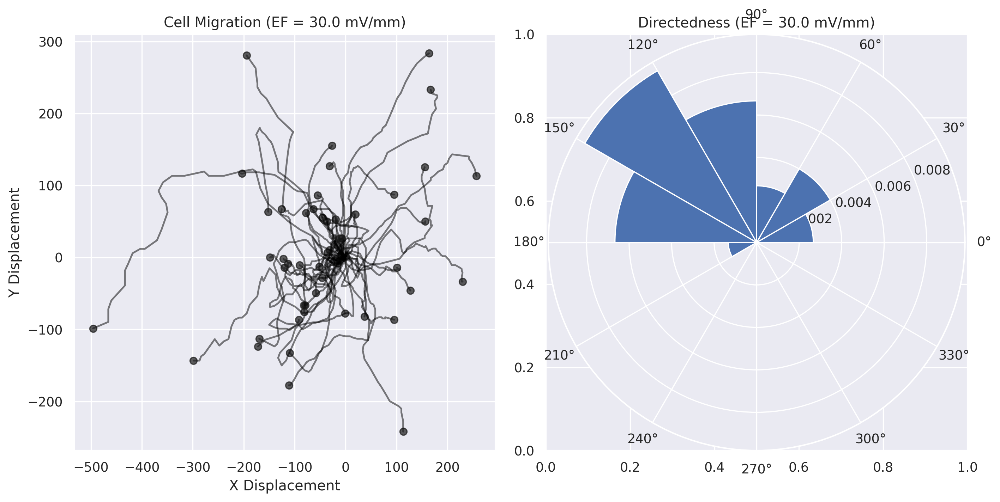

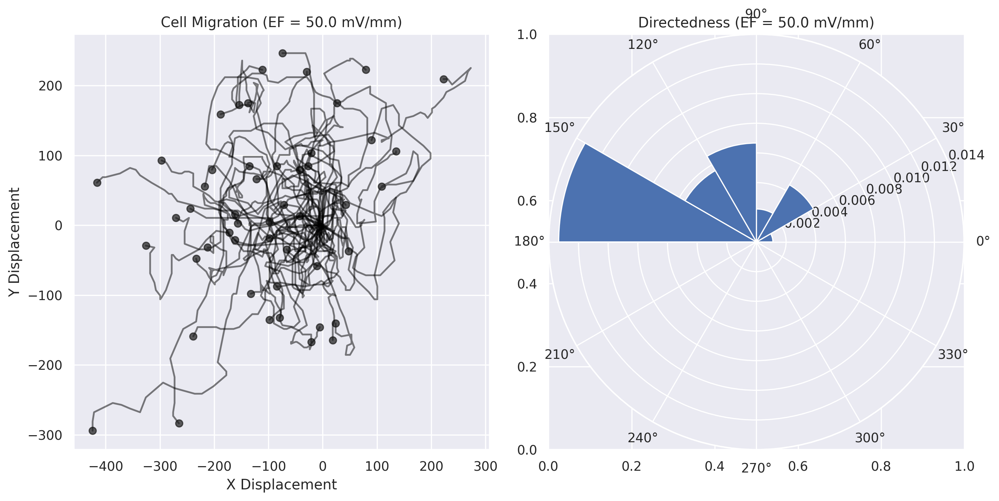

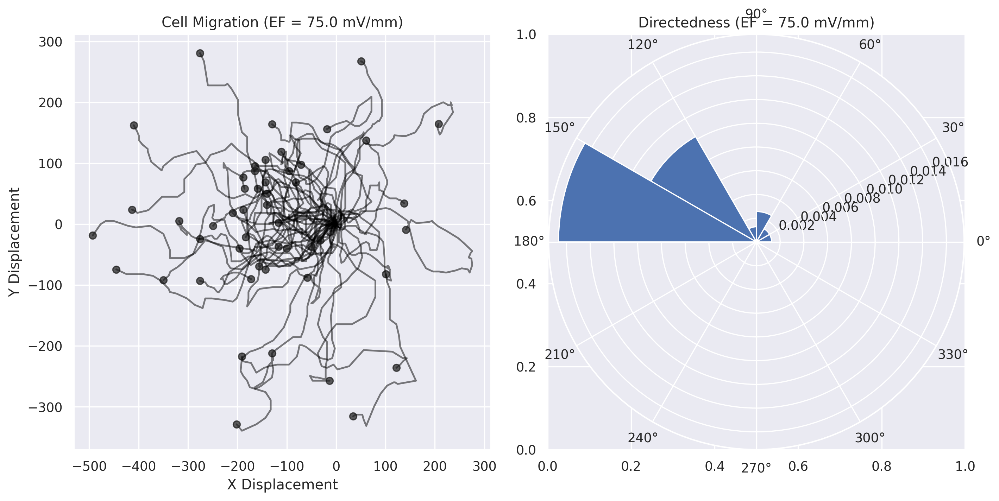

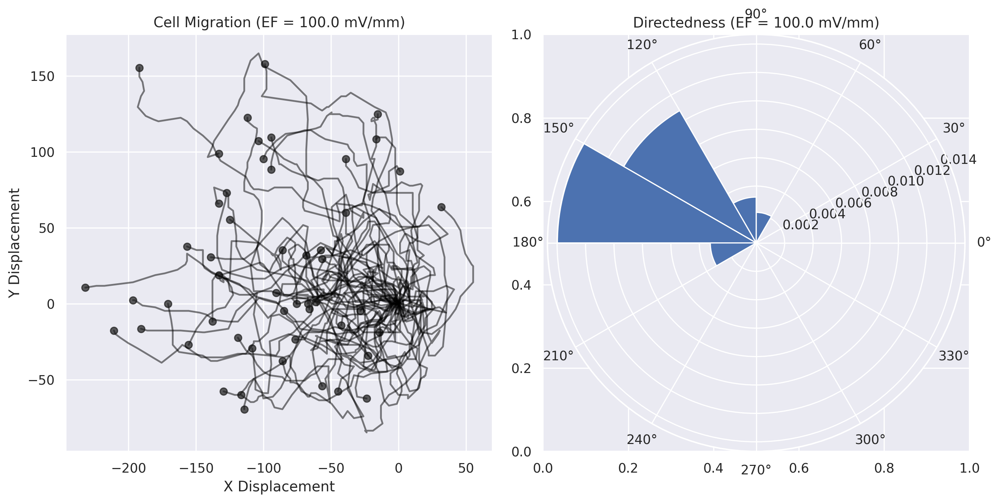

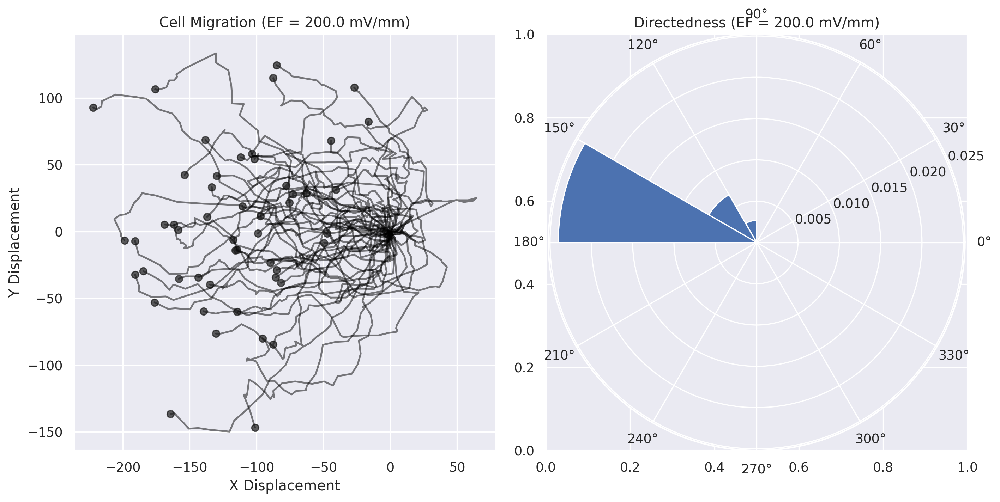

In [87]:

volts = df['volt'].unique()
in_cols = ['volt', 'cum_dir'] #['X', 'Y']

out_cols = ['cum_dir']  #['X', 'Y']

for volt in volts:  # Iterate through 77 cells
    cells = df[df['volt']==volt]['track'].unique()

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6), dpi=240)

    last_dir = []
    all_angles = []

    for cell_idx in cells:
        # Each cell has 37 time points, extract corresponding rows

        cell_data = df[(df['track'] == cell_idx) & (df['volt'] == volt)] #df_shifted.iloc[cell_idx * 37:(cell_idx + 1) * 37]

        # print(cell_data)
        x_positions = cell_data['x'].values
        y_positions = cell_data['y'].values
        direction = cell_data['cum_dir'].values
        time_points = cell_data['slice'].values
        # angles = cell_data['angle'].values

        # plot
        ax1.plot(x_positions, y_positions,
                 label=f'Cell {cell_idx}', alpha=0.5, color='black')
        ax1.plot(x_positions[-1], y_positions[-1], marker='o', color='k', alpha=0.7)

        last_dir.extend(direction)
        # all_angles.append(angles[-1])

        y_diff = cell_data['y'].iloc[-1]-cell_data['y'].iloc[0]
        x_diff = cell_data['x'].iloc[-1]-cell_data['x'].iloc[0]

        angle_radians = np.arctan2(y_diff, x_diff)

        # print(angle_radians)
        all_angles.append(angle_radians)



    ax1.set_title(f"Cell Migration (EF = {volt*1000} mV/mm)")
    ax1.set_xlabel("X Displacement")
    ax1.set_ylabel("Y Displacement")
    ax1.grid(True)


    ax2 = fig.add_subplot(122, polar=True)
    ax2.set_theta_zero_location("E")
    ax2.set_theta_direction(1)


    angles_degrees = np.degrees(all_angles)

    bins = np.arange(0, 361, 30)

    hist, _ = np.histogram(angles_degrees, bins=bins, density=True)

    ax2.bar([i*np.pi/6+np.pi/12 for i in range(12)],hist,width=np.pi/6)

    ax2.set_title(f"Directedness (EF = {volt * 1000} mV/mm)")

    theta_ticks = np.arange(0, 360, 30)  # Ticks at 0, 30, ..., 330 degrees
    ax2.set_xticks(np.deg2rad(theta_ticks))  # Convert to radians

    ax2.set_thetamin(0)
    ax2.set_thetamax(360)
    ax2.set_xticks([i*np.pi/6 for i in range(12)])

    ax2.grid(True)


    plt.tight_layout()
    plt.show()